# UNET ++

## Setup

Install packages, import libraries, set dataset/output paths, and create the output folder.

In [1]:
!pip -q install segmentation-models-pytorch

import os
import numpy as np
import cv2
import torch
import albumentations as A
import segmentation_models_pytorch as smp
from pathlib import Path

# Kaggle paths:
DATASET_ROOT = "/kaggle/input/bccd-dataset-with-mask/BCCD Dataset with mask"
OUTPUT_DIR = "/kaggle/working/blood_cell_outputs_unetpp"

# Create output directory
Path(OUTPUT_DIR).mkdir(parents=True, exist_ok=True)

print(f"DATASET_ROOT: {DATASET_ROOT}")
print(f"OUTPUT_DIR: {OUTPUT_DIR}")
print("Dataset folders:", os.listdir("/kaggle/input"))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 9.9 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

DATASET_ROOT: /kaggle/input/bccd-dataset-with-mask/BCCD Dataset with mask
OUTPUT_DIR: /kaggle/working/blood_cell_outputs_unetpp
Dataset folders: ['bccd-dataset-with-mask']


## Dataset + loaders
Define augmentations, load image/mask pairs, convert masks to binary, and build train/val DataLoaders.

In [2]:
import os, glob, cv2, numpy as np, torch
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

def get_transforms(img_size=512, train=True):
    t = [
        A.LongestMaxSize(max_size=img_size),
        A.PadIfNeeded(min_height=img_size, min_width=img_size, border_mode=0),
    ]
    if train:
        t += [
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.ElasticTransform(alpha=120, sigma=120 * 0.05, p=0.3),
            A.GridDistortion(p=0.3),
            A.GaussNoise(p=0.3),
            A.RandomBrightnessContrast(p=0.4),
        ]
    t += [
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ]
    return A.Compose(t)

def collect_pairs(root, subdir):
    od = os.path.join(root, subdir, "original")
    md = os.path.join(root, subdir, "mask")
    pairs = []
    for ip in sorted(glob.glob(os.path.join(od, "*.*"))):
        fn = os.path.splitext(os.path.basename(ip))[0]
        cand = [os.path.join(md, fn + ext) for ext in [".png", "_mask.png", ".jpg", ".jpeg"]]
        mp = next((p for p in cand if os.path.isfile(p)), None)
        if mp:
            pairs.append((ip, mp))
    return pairs

class BCCDSemanticDataset(Dataset):
    def __init__(self, pairs, img_size=512, train=True):
        self.pairs = pairs
        self.transform = get_transforms(img_size, train=train)

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        img_path, mask_path = self.pairs[idx]

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = (mask > 0).astype(np.float32)

        augmented = self.transform(image=image, mask=mask)
        image = augmented["image"]
        mask = augmented["mask"]

        if mask.ndim == 2:
            mask = mask.unsqueeze(0)  # (1, H, W)

        return image, mask

train_pairs_all = collect_pairs(DATASET_ROOT, "train")
test_pairs = collect_pairs(DATASET_ROOT, "test")

# random split
rng = np.random.default_rng(42)
idx = np.arange(len(train_pairs_all))
rng.shuffle(idx)

val_len = int(0.15 * len(train_pairs_all))
val_idx = idx[:val_len]
train_idx = idx[val_len:]

train_pairs = [train_pairs_all[i] for i in train_idx]
val_pairs   = [train_pairs_all[i] for i in val_idx]

train_ds = BCCDSemanticDataset(train_pairs, img_size=512, train=True)
val_ds   = BCCDSemanticDataset(val_pairs,   img_size=512, train=False)
test_ds  = BCCDSemanticDataset(test_pairs,  img_size=512, train=False)  # for final evaluation

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=8, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=8, shuffle=False, num_workers=2, pin_memory=True)

print("Train:", len(train_ds), "Val:", len(val_ds), "Test:", len(test_ds))

Train: 994 Val: 175 Test: 159


## Seed helper

In [3]:
import random
import numpy as np
import torch

def set_seed(seed: int):
    print(f"\n=== Setting seed {seed} ===")
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

SEEDS = [0, 1, 2]  # three runs per model
print("Seeds to use:", SEEDS)

Seeds to use: [0, 1, 2]


## Generic test-eval helper

In [4]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, roc_auc_score
import time

def eval_on_test(model, best_path, threshold=0.5):
    """
    Load best weights from best_path into model and evaluate on test_loader.
    Returns dictionary with all metrics including those from YOLOv8-seg.
    """
    import numpy as np

    model.load_state_dict(torch.load(best_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    test_d, test_i = [], []
    all_pred_masks = []
    all_gt_masks = []
    
    # FPS measurement
    start_time = time.time()
    num_images = 0
    
    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            logits = model(images)
            
            d, iou, preds_bin = calculate_metrics(logits, masks, threshold=threshold, return_preds=True)
            test_d.append(d)
            test_i.append(iou)
            
            # Collect flattened predictions and ground truth for pixel-level metrics
            all_pred_masks.append(preds_bin.cpu().numpy().flatten())
            all_gt_masks.append(masks.cpu().numpy().flatten())
            
            num_images += images.size(0)
    
    end_time = time.time()
    fps = num_images / (end_time - start_time)
    
    # Flatten all predictions and ground truth
    all_pred_flat = np.concatenate(all_pred_masks)
    all_gt_flat = np.concatenate(all_gt_masks)
    
    # Calculate pixel-level metrics
    pixel_accuracy = accuracy_score(all_gt_flat, all_pred_flat)
    pixel_precision = precision_score(all_gt_flat, all_pred_flat, zero_division=0)
    pixel_recall = recall_score(all_gt_flat, all_pred_flat, zero_division=0)
    pixel_f1 = f1_score(all_gt_flat, all_pred_flat, zero_division=0)
    
    # Calculate ROC-AUC (using binary predictions)
    try:
        roc_auc = roc_auc_score(all_gt_flat, all_pred_flat) if len(np.unique(all_gt_flat)) > 1 else 0.0
    except:
        roc_auc = 0.0

    test_dice = float(np.mean(test_d))
    test_iou = float(np.mean(test_i))
    
    return {
        'test_dice': test_dice,
        'test_iou': test_iou,
        'pixel_accuracy': float(pixel_accuracy),
        'pixel_precision': float(pixel_precision),
        'pixel_recall': float(pixel_recall),
        'pixel_f1': float(pixel_f1),
        'roc_auc': float(roc_auc),
        'fps': float(fps)
    }

# Metrics Utility
def calculate_metrics(preds, targets, threshold=0.5, return_preds=False):
    probs = torch.sigmoid(preds)
    preds_bin = (probs > threshold).float()
    intersection = (preds_bin * targets).sum()
    union = preds_bin.sum() + targets.sum() - intersection
    dice = (2 * intersection) / (preds_bin.sum() + targets.sum() + 1e-8)
    iou = intersection / (union + 1e-8)
    
    if return_preds:
        return dice.item(), iou.item(), preds_bin
    return dice.item(), iou.item()

## Model + training config
Pick device, create U-Net++ (EfficientNet-B0), set Dice+BCE loss, and configure optimizer + LR scheduler.

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
import segmentation_models_pytorch as smp

# Device configuration
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")

# Initialize U-Net++ model
model = smp.UnetPlusPlus(
    encoder_name="efficientnet-b3",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
)
model.to(DEVICE)

# Loss Function (Dice + BCE)
dice_loss_fn = smp.losses.DiceLoss(mode='binary', from_logits=True)
bce_loss_fn = nn.BCEWithLogitsLoss()

def criterion(preds, targets):
    return dice_loss_fn(preds, targets) + bce_loss_fn(preds, targets)

# Optimizer and Scheduler
LR = 1e-3
EPOCHS = 40
optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

print("Model, criterion, optimizer, and scheduler initialized.")

Device: cuda


config.json:   0%|          | 0.00/106 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

Model, criterion, optimizer, and scheduler initialized.


## Train + validate + save
Resume if a checkpoint exists, train/validate each epoch, track Dice/IoU history, save last checkpoint and best model.

In [6]:
import os
import numpy as np
import torch
from tqdm import tqdm
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.optim as optim

# model + loss settings reused across seeds
LR = 1e-3
EPOCHS = 50
dice_loss_fn = smp.losses.DiceLoss(mode='binary', from_logits=True)
bce_loss_fn = nn.BCEWithLogitsLoss()

def unetpp_criterion(preds, targets):
    return dice_loss_fn(preds, targets) + bce_loss_fn(preds, targets)

unetpp_seed_results = []  # will store test Dice/IoU for each seed

for seed in SEEDS:
    print("\n" + "="*60)
    print(f"U-Net++ training for seed {seed}")
    print("="*60)
    set_seed(seed)

    # model, optimizer, scheduler for each seed
    model = smp.UnetPlusPlus(
        encoder_name="efficientnet-b3",
        encoder_weights="imagenet",
        in_channels=3,
        classes=1,
    )
    model.to(DEVICE)

    optimizer = optim.AdamW(model.parameters(), lr=LR)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

    # Seed-specific checkpoints
    BEST_MODEL_PATH = os.path.join(OUTPUT_DIR, f"best_unet_plusplus_seed{seed}.pt")
    LAST_MODEL_PATH = os.path.join(OUTPUT_DIR, f"last_unet_plusplus_seed{seed}.pt")

    start_epoch = 0
    best_dice = 0.0
    history = {
        'train_loss': [],
        'val_loss': [],
        'val_dice': [],
        'val_iou': []
    }

    print(f"Starting training for {EPOCHS} epochs...")

    for epoch in range(start_epoch, EPOCHS):
        # TRAIN
        model.train()
        train_loss = 0.0
        pbar = tqdm(train_loader, desc=f"[U-Net++ seed={seed}] Epoch {epoch+1}/{EPOCHS} [Train]")

        for images, masks in pbar:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)

            optimizer.zero_grad()
            outputs = model(images)
            loss = unetpp_criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            pbar.set_postfix({'loss': f"{loss.item():.4f}"})

        avg_train_loss = train_loss / len(train_loader)

        # VALIDATION
        model.eval()
        val_loss = 0.0
        val_dice_scores = []
        val_iou_scores = []

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"[U-Net++ seed={seed}] Epoch {epoch+1}/{EPOCHS} [Val]"):
                images = images.to(DEVICE)
                masks = masks.to(DEVICE)

                outputs = model(images)
                loss = unetpp_criterion(outputs, masks)
                val_loss += loss.item()

                d, iou = calculate_metrics(outputs, masks)
                val_dice_scores.append(d)
                val_iou_scores.append(iou)

        avg_val_loss = val_loss / len(val_loader)
        avg_val_dice = float(np.mean(val_dice_scores))
        avg_val_iou = float(np.mean(val_iou_scores))

        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(avg_val_loss)
        history['val_dice'].append(avg_val_dice)
        history['val_iou'].append(avg_val_iou)

        scheduler.step()

        print(
            f"[U-Net++ seed={seed}] Epoch {epoch+1} | "
            f"Train Loss: {avg_train_loss:.4f} | "
            f"Val Loss: {avg_val_loss:.4f} | "
            f"Val Dice: {avg_val_dice:.4f} | "
            f"Val IoU: {avg_val_iou:.4f}"
        )

        # Save LAST checkpoint
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_dice': best_dice,
            'history': history
        }, LAST_MODEL_PATH)

        # Save BEST by val Dice
        if avg_val_dice > best_dice:
            best_dice = avg_val_dice
            torch.save(model.state_dict(), BEST_MODEL_PATH)
            print(f"[U-Net++ seed={seed}] New best model saved! Dice: {best_dice:.4f}")

    print(f"[U-Net++ seed={seed}] Training finished. Best Val Dice: {best_dice:.4f}")

    # Evaluate this seed on TEST
    test_results = eval_on_test(model, BEST_MODEL_PATH, threshold=0.5)
    print(f"[U-Net++ seed={seed}] TEST Results:")
    print(f"  Dice: {test_results['test_dice']:.4f} | IoU: {test_results['test_iou']:.4f}")
    print(f"  Pixel Accuracy: {test_results['pixel_accuracy']:.4f}")
    print(f"  Pixel Precision: {test_results['pixel_precision']:.4f}")
    print(f"  Pixel Recall: {test_results['pixel_recall']:.4f}")
    print(f"  Pixel F1: {test_results['pixel_f1']:.4f}")
    print(f"  ROC-AUC: {test_results['roc_auc']:.4f}")
    print(f"  FPS: {test_results['fps']:.2f}")

    unetpp_seed_results.append({
        "seed": seed,
        "test_dice": test_results['test_dice'],
        "test_iou": test_results['test_iou'],
        "pixel_accuracy": test_results['pixel_accuracy'],
        "pixel_precision": test_results['pixel_precision'],
        "pixel_recall": test_results['pixel_recall'],
        "pixel_f1": test_results['pixel_f1'],
        "roc_auc": test_results['roc_auc'],
        "fps": test_results['fps'],
        "best_val_dice": best_dice,
    })

print("\nU-Net++ results over seeds:")
for r in unetpp_seed_results:
    print(r)

# Print summary statistics
print("\n" + "="*60)
print("U-Net++ Summary Across Seeds:")
print("="*60)
metrics_to_summarize = ['test_dice', 'test_iou', 'pixel_accuracy', 'pixel_precision', 
                         'pixel_recall', 'pixel_f1', 'roc_auc', 'fps']
for metric in metrics_to_summarize:
    values = [r[metric] for r in unetpp_seed_results]
    print(f"{metric}: {np.mean(values):.4f} ± {np.std(values):.4f} (min: {np.min(values):.4f}, max: {np.max(values):.4f})")


U-Net++ training for seed 0

=== Setting seed 0 ===
Starting training for 50 epochs...


[U-Net++ seed=0] Epoch 1/50 [Val]: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]


[U-Net++ seed=0] Epoch 1 | Train Loss: 0.3250 | Val Loss: 0.1594 | Val Dice: 0.9413 | Val IoU: 0.8892
[U-Net++ seed=0] New best model saved! Dice: 0.9413


[U-Net++ seed=0] Epoch 2/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=0] Epoch 2 | Train Loss: 0.1525 | Val Loss: 0.1261 | Val Dice: 0.9492 | Val IoU: 0.9033
[U-Net++ seed=0] New best model saved! Dice: 0.9492


[U-Net++ seed=0] Epoch 3/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=0] Epoch 3 | Train Loss: 0.1374 | Val Loss: 0.1212 | Val Dice: 0.9510 | Val IoU: 0.9067
[U-Net++ seed=0] New best model saved! Dice: 0.9510


[U-Net++ seed=0] Epoch 4/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=0] Epoch 4 | Train Loss: 0.1285 | Val Loss: 0.1136 | Val Dice: 0.9545 | Val IoU: 0.9131
[U-Net++ seed=0] New best model saved! Dice: 0.9545


[U-Net++ seed=0] Epoch 5/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=0] Epoch 5 | Train Loss: 0.1270 | Val Loss: 0.1097 | Val Dice: 0.9560 | Val IoU: 0.9159
[U-Net++ seed=0] New best model saved! Dice: 0.9560


[U-Net++ seed=0] Epoch 6/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]


[U-Net++ seed=0] Epoch 6 | Train Loss: 0.1242 | Val Loss: 0.1148 | Val Dice: 0.9548 | Val IoU: 0.9136


[U-Net++ seed=0] Epoch 7/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=0] Epoch 7 | Train Loss: 0.1183 | Val Loss: 0.1088 | Val Dice: 0.9563 | Val IoU: 0.9163
[U-Net++ seed=0] New best model saved! Dice: 0.9563


[U-Net++ seed=0] Epoch 8/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=0] Epoch 8 | Train Loss: 0.1276 | Val Loss: 0.1133 | Val Dice: 0.9558 | Val IoU: 0.9155


[U-Net++ seed=0] Epoch 9/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=0] Epoch 9 | Train Loss: 0.1186 | Val Loss: 0.1119 | Val Dice: 0.9542 | Val IoU: 0.9127


[U-Net++ seed=0] Epoch 10/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=0] Epoch 10 | Train Loss: 0.1164 | Val Loss: 0.1093 | Val Dice: 0.9558 | Val IoU: 0.9156


[U-Net++ seed=0] Epoch 11/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=0] Epoch 11 | Train Loss: 0.1122 | Val Loss: 0.0998 | Val Dice: 0.9600 | Val IoU: 0.9232
[U-Net++ seed=0] New best model saved! Dice: 0.9600


[U-Net++ seed=0] Epoch 12/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.40it/s]


[U-Net++ seed=0] Epoch 12 | Train Loss: 0.1122 | Val Loss: 0.0982 | Val Dice: 0.9613 | Val IoU: 0.9256
[U-Net++ seed=0] New best model saved! Dice: 0.9613


[U-Net++ seed=0] Epoch 13/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=0] Epoch 13 | Train Loss: 0.1106 | Val Loss: 0.0959 | Val Dice: 0.9617 | Val IoU: 0.9263
[U-Net++ seed=0] New best model saved! Dice: 0.9617


[U-Net++ seed=0] Epoch 14/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]


[U-Net++ seed=0] Epoch 14 | Train Loss: 0.1114 | Val Loss: 0.0978 | Val Dice: 0.9617 | Val IoU: 0.9262


[U-Net++ seed=0] Epoch 15/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]


[U-Net++ seed=0] Epoch 15 | Train Loss: 0.1148 | Val Loss: 0.0955 | Val Dice: 0.9616 | Val IoU: 0.9261


[U-Net++ seed=0] Epoch 16/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]


[U-Net++ seed=0] Epoch 16 | Train Loss: 0.1132 | Val Loss: 0.0979 | Val Dice: 0.9606 | Val IoU: 0.9243


[U-Net++ seed=0] Epoch 17/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=0] Epoch 17 | Train Loss: 0.1095 | Val Loss: 0.0925 | Val Dice: 0.9630 | Val IoU: 0.9287
[U-Net++ seed=0] New best model saved! Dice: 0.9630


[U-Net++ seed=0] Epoch 18/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=0] Epoch 18 | Train Loss: 0.1079 | Val Loss: 0.0928 | Val Dice: 0.9629 | Val IoU: 0.9285


[U-Net++ seed=0] Epoch 19/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=0] Epoch 19 | Train Loss: 0.1065 | Val Loss: 0.0942 | Val Dice: 0.9622 | Val IoU: 0.9271


[U-Net++ seed=0] Epoch 20/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=0] Epoch 20 | Train Loss: 0.1064 | Val Loss: 0.0975 | Val Dice: 0.9600 | Val IoU: 0.9232


[U-Net++ seed=0] Epoch 21/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=0] Epoch 21 | Train Loss: 0.1061 | Val Loss: 0.0933 | Val Dice: 0.9623 | Val IoU: 0.9273


[U-Net++ seed=0] Epoch 22/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.40it/s]


[U-Net++ seed=0] Epoch 22 | Train Loss: 0.1047 | Val Loss: 0.0920 | Val Dice: 0.9631 | Val IoU: 0.9289
[U-Net++ seed=0] New best model saved! Dice: 0.9631


[U-Net++ seed=0] Epoch 23/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=0] Epoch 23 | Train Loss: 0.1036 | Val Loss: 0.0928 | Val Dice: 0.9630 | Val IoU: 0.9287


[U-Net++ seed=0] Epoch 24/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=0] Epoch 24 | Train Loss: 0.1033 | Val Loss: 0.0937 | Val Dice: 0.9623 | Val IoU: 0.9274


[U-Net++ seed=0] Epoch 25/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=0] Epoch 25 | Train Loss: 0.1031 | Val Loss: 0.0919 | Val Dice: 0.9629 | Val IoU: 0.9286


[U-Net++ seed=0] Epoch 26/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.41it/s]


[U-Net++ seed=0] Epoch 26 | Train Loss: 0.1024 | Val Loss: 0.0929 | Val Dice: 0.9627 | Val IoU: 0.9281


[U-Net++ seed=0] Epoch 27/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]


[U-Net++ seed=0] Epoch 27 | Train Loss: 0.1013 | Val Loss: 0.0939 | Val Dice: 0.9619 | Val IoU: 0.9267


[U-Net++ seed=0] Epoch 28/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=0] Epoch 28 | Train Loss: 0.1007 | Val Loss: 0.0941 | Val Dice: 0.9622 | Val IoU: 0.9273


[U-Net++ seed=0] Epoch 29/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=0] Epoch 29 | Train Loss: 0.1012 | Val Loss: 0.0929 | Val Dice: 0.9625 | Val IoU: 0.9277


[U-Net++ seed=0] Epoch 30/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=0] Epoch 30 | Train Loss: 0.1006 | Val Loss: 0.0948 | Val Dice: 0.9619 | Val IoU: 0.9267


[U-Net++ seed=0] Epoch 31/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=0] Epoch 31 | Train Loss: 0.1010 | Val Loss: 0.0914 | Val Dice: 0.9630 | Val IoU: 0.9287


[U-Net++ seed=0] Epoch 32/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=0] Epoch 32 | Train Loss: 0.0995 | Val Loss: 0.0944 | Val Dice: 0.9620 | Val IoU: 0.9268


[U-Net++ seed=0] Epoch 33/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=0] Epoch 33 | Train Loss: 0.1000 | Val Loss: 0.0940 | Val Dice: 0.9618 | Val IoU: 0.9265


[U-Net++ seed=0] Epoch 34/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]


[U-Net++ seed=0] Epoch 34 | Train Loss: 0.0985 | Val Loss: 0.0975 | Val Dice: 0.9607 | Val IoU: 0.9244


[U-Net++ seed=0] Epoch 35/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]


[U-Net++ seed=0] Epoch 35 | Train Loss: 0.0987 | Val Loss: 0.0929 | Val Dice: 0.9624 | Val IoU: 0.9277


[U-Net++ seed=0] Epoch 36/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=0] Epoch 36 | Train Loss: 0.0984 | Val Loss: 0.0927 | Val Dice: 0.9624 | Val IoU: 0.9275


[U-Net++ seed=0] Epoch 37/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=0] Epoch 37 | Train Loss: 0.0977 | Val Loss: 0.0919 | Val Dice: 0.9629 | Val IoU: 0.9285


[U-Net++ seed=0] Epoch 38/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=0] Epoch 38 | Train Loss: 0.0986 | Val Loss: 0.0913 | Val Dice: 0.9631 | Val IoU: 0.9289


[U-Net++ seed=0] Epoch 39/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=0] Epoch 39 | Train Loss: 0.0966 | Val Loss: 0.0909 | Val Dice: 0.9634 | Val IoU: 0.9295
[U-Net++ seed=0] New best model saved! Dice: 0.9634


[U-Net++ seed=0] Epoch 40/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=0] Epoch 40 | Train Loss: 0.0977 | Val Loss: 0.0913 | Val Dice: 0.9631 | Val IoU: 0.9289


[U-Net++ seed=0] Epoch 41/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=0] Epoch 41 | Train Loss: 0.0971 | Val Loss: 0.0902 | Val Dice: 0.9637 | Val IoU: 0.9299
[U-Net++ seed=0] New best model saved! Dice: 0.9637


[U-Net++ seed=0] Epoch 42/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=0] Epoch 42 | Train Loss: 0.0970 | Val Loss: 0.0905 | Val Dice: 0.9635 | Val IoU: 0.9297


[U-Net++ seed=0] Epoch 43/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.27it/s]


[U-Net++ seed=0] Epoch 43 | Train Loss: 0.0965 | Val Loss: 0.0908 | Val Dice: 0.9633 | Val IoU: 0.9293


[U-Net++ seed=0] Epoch 44/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=0] Epoch 44 | Train Loss: 0.0958 | Val Loss: 0.0900 | Val Dice: 0.9637 | Val IoU: 0.9301
[U-Net++ seed=0] New best model saved! Dice: 0.9637


[U-Net++ seed=0] Epoch 45/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=0] Epoch 45 | Train Loss: 0.0963 | Val Loss: 0.0901 | Val Dice: 0.9637 | Val IoU: 0.9300


[U-Net++ seed=0] Epoch 46/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=0] Epoch 46 | Train Loss: 0.0957 | Val Loss: 0.0900 | Val Dice: 0.9637 | Val IoU: 0.9301
[U-Net++ seed=0] New best model saved! Dice: 0.9637


[U-Net++ seed=0] Epoch 47/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=0] Epoch 47 | Train Loss: 0.0963 | Val Loss: 0.0900 | Val Dice: 0.9637 | Val IoU: 0.9301


[U-Net++ seed=0] Epoch 48/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]


[U-Net++ seed=0] Epoch 48 | Train Loss: 0.0949 | Val Loss: 0.0903 | Val Dice: 0.9636 | Val IoU: 0.9298


[U-Net++ seed=0] Epoch 49/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=0] Epoch 49 | Train Loss: 0.0952 | Val Loss: 0.0903 | Val Dice: 0.9636 | Val IoU: 0.9298


[U-Net++ seed=0] Epoch 50/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=0] Epoch 50 | Train Loss: 0.0950 | Val Loss: 0.0903 | Val Dice: 0.9636 | Val IoU: 0.9298
[U-Net++ seed=0] Training finished. Best Val Dice: 0.9637
[U-Net++ seed=0] TEST Results:
  Dice: 0.9610 | IoU: 0.9251
  Pixel Accuracy: 0.9822
  Pixel Precision: 0.9654
  Pixel Recall: 0.9576
  Pixel F1: 0.9615
  ROC-AUC: 0.9736
  FPS: 16.11

U-Net++ training for seed 1

=== Setting seed 1 ===
Starting training for 50 epochs...


[U-Net++ seed=1] Epoch 1/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=1] Epoch 1 | Train Loss: 0.3374 | Val Loss: 0.1382 | Val Dice: 0.9464 | Val IoU: 0.8983
[U-Net++ seed=1] New best model saved! Dice: 0.9464


[U-Net++ seed=1] Epoch 2/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=1] Epoch 2 | Train Loss: 0.1548 | Val Loss: 0.1185 | Val Dice: 0.9543 | Val IoU: 0.9127
[U-Net++ seed=1] New best model saved! Dice: 0.9543


[U-Net++ seed=1] Epoch 3/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=1] Epoch 3 | Train Loss: 0.1350 | Val Loss: 0.1149 | Val Dice: 0.9549 | Val IoU: 0.9139
[U-Net++ seed=1] New best model saved! Dice: 0.9549


[U-Net++ seed=1] Epoch 4/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=1] Epoch 4 | Train Loss: 0.1308 | Val Loss: 0.1088 | Val Dice: 0.9577 | Val IoU: 0.9190
[U-Net++ seed=1] New best model saved! Dice: 0.9577


[U-Net++ seed=1] Epoch 5/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=1] Epoch 5 | Train Loss: 0.1278 | Val Loss: 0.1170 | Val Dice: 0.9542 | Val IoU: 0.9126


[U-Net++ seed=1] Epoch 6/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=1] Epoch 6 | Train Loss: 0.1242 | Val Loss: 0.1040 | Val Dice: 0.9586 | Val IoU: 0.9206
[U-Net++ seed=1] New best model saved! Dice: 0.9586


[U-Net++ seed=1] Epoch 7/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.41it/s]


[U-Net++ seed=1] Epoch 7 | Train Loss: 0.1190 | Val Loss: 0.1024 | Val Dice: 0.9594 | Val IoU: 0.9220
[U-Net++ seed=1] New best model saved! Dice: 0.9594


[U-Net++ seed=1] Epoch 8/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=1] Epoch 8 | Train Loss: 0.1182 | Val Loss: 0.1032 | Val Dice: 0.9591 | Val IoU: 0.9215


[U-Net++ seed=1] Epoch 9/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=1] Epoch 9 | Train Loss: 0.1156 | Val Loss: 0.0994 | Val Dice: 0.9605 | Val IoU: 0.9240
[U-Net++ seed=1] New best model saved! Dice: 0.9605


[U-Net++ seed=1] Epoch 10/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=1] Epoch 10 | Train Loss: 0.1132 | Val Loss: 0.0986 | Val Dice: 0.9601 | Val IoU: 0.9233


[U-Net++ seed=1] Epoch 11/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=1] Epoch 11 | Train Loss: 0.1179 | Val Loss: 0.1021 | Val Dice: 0.9594 | Val IoU: 0.9220


[U-Net++ seed=1] Epoch 12/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=1] Epoch 12 | Train Loss: 0.1123 | Val Loss: 0.1019 | Val Dice: 0.9583 | Val IoU: 0.9200


[U-Net++ seed=1] Epoch 13/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=1] Epoch 13 | Train Loss: 0.1114 | Val Loss: 0.1025 | Val Dice: 0.9584 | Val IoU: 0.9202


[U-Net++ seed=1] Epoch 14/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=1] Epoch 14 | Train Loss: 0.1098 | Val Loss: 0.0985 | Val Dice: 0.9609 | Val IoU: 0.9248
[U-Net++ seed=1] New best model saved! Dice: 0.9609


[U-Net++ seed=1] Epoch 15/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]


[U-Net++ seed=1] Epoch 15 | Train Loss: 0.1086 | Val Loss: 0.0949 | Val Dice: 0.9620 | Val IoU: 0.9268
[U-Net++ seed=1] New best model saved! Dice: 0.9620


[U-Net++ seed=1] Epoch 16/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=1] Epoch 16 | Train Loss: 0.1096 | Val Loss: 0.0954 | Val Dice: 0.9614 | Val IoU: 0.9258


[U-Net++ seed=1] Epoch 17/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=1] Epoch 17 | Train Loss: 0.1086 | Val Loss: 0.0946 | Val Dice: 0.9622 | Val IoU: 0.9273
[U-Net++ seed=1] New best model saved! Dice: 0.9622


[U-Net++ seed=1] Epoch 18/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]


[U-Net++ seed=1] Epoch 18 | Train Loss: 0.1072 | Val Loss: 0.0941 | Val Dice: 0.9625 | Val IoU: 0.9278
[U-Net++ seed=1] New best model saved! Dice: 0.9625


[U-Net++ seed=1] Epoch 19/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=1] Epoch 19 | Train Loss: 0.1058 | Val Loss: 0.0944 | Val Dice: 0.9626 | Val IoU: 0.9279
[U-Net++ seed=1] New best model saved! Dice: 0.9626


[U-Net++ seed=1] Epoch 20/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=1] Epoch 20 | Train Loss: 0.1048 | Val Loss: 0.0958 | Val Dice: 0.9611 | Val IoU: 0.9252


[U-Net++ seed=1] Epoch 21/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=1] Epoch 21 | Train Loss: 0.1042 | Val Loss: 0.0940 | Val Dice: 0.9626 | Val IoU: 0.9280
[U-Net++ seed=1] New best model saved! Dice: 0.9626


[U-Net++ seed=1] Epoch 22/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=1] Epoch 22 | Train Loss: 0.1048 | Val Loss: 0.0936 | Val Dice: 0.9629 | Val IoU: 0.9285
[U-Net++ seed=1] New best model saved! Dice: 0.9629


[U-Net++ seed=1] Epoch 23/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=1] Epoch 23 | Train Loss: 0.1026 | Val Loss: 0.0930 | Val Dice: 0.9629 | Val IoU: 0.9285
[U-Net++ seed=1] New best model saved! Dice: 0.9629


[U-Net++ seed=1] Epoch 24/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=1] Epoch 24 | Train Loss: 0.1032 | Val Loss: 0.0918 | Val Dice: 0.9633 | Val IoU: 0.9292
[U-Net++ seed=1] New best model saved! Dice: 0.9633


[U-Net++ seed=1] Epoch 25/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=1] Epoch 25 | Train Loss: 0.1017 | Val Loss: 0.0919 | Val Dice: 0.9633 | Val IoU: 0.9293
[U-Net++ seed=1] New best model saved! Dice: 0.9633


[U-Net++ seed=1] Epoch 26/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]


[U-Net++ seed=1] Epoch 26 | Train Loss: 0.1010 | Val Loss: 0.0928 | Val Dice: 0.9627 | Val IoU: 0.9281


[U-Net++ seed=1] Epoch 27/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=1] Epoch 27 | Train Loss: 0.1028 | Val Loss: 0.0909 | Val Dice: 0.9636 | Val IoU: 0.9297
[U-Net++ seed=1] New best model saved! Dice: 0.9636


[U-Net++ seed=1] Epoch 28/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]


[U-Net++ seed=1] Epoch 28 | Train Loss: 0.1017 | Val Loss: 0.0926 | Val Dice: 0.9626 | Val IoU: 0.9280


[U-Net++ seed=1] Epoch 29/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=1] Epoch 29 | Train Loss: 0.1012 | Val Loss: 0.0918 | Val Dice: 0.9633 | Val IoU: 0.9292


[U-Net++ seed=1] Epoch 30/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=1] Epoch 30 | Train Loss: 0.0993 | Val Loss: 0.0911 | Val Dice: 0.9634 | Val IoU: 0.9294


[U-Net++ seed=1] Epoch 31/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=1] Epoch 31 | Train Loss: 0.1001 | Val Loss: 0.0932 | Val Dice: 0.9624 | Val IoU: 0.9275


[U-Net++ seed=1] Epoch 32/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=1] Epoch 32 | Train Loss: 0.0991 | Val Loss: 0.0936 | Val Dice: 0.9627 | Val IoU: 0.9281


[U-Net++ seed=1] Epoch 33/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=1] Epoch 33 | Train Loss: 0.0984 | Val Loss: 0.0927 | Val Dice: 0.9631 | Val IoU: 0.9289


[U-Net++ seed=1] Epoch 34/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=1] Epoch 34 | Train Loss: 0.0976 | Val Loss: 0.0929 | Val Dice: 0.9628 | Val IoU: 0.9283


[U-Net++ seed=1] Epoch 35/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=1] Epoch 35 | Train Loss: 0.0979 | Val Loss: 0.0921 | Val Dice: 0.9629 | Val IoU: 0.9285


[U-Net++ seed=1] Epoch 36/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=1] Epoch 36 | Train Loss: 0.0973 | Val Loss: 0.0925 | Val Dice: 0.9629 | Val IoU: 0.9286


[U-Net++ seed=1] Epoch 37/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]


[U-Net++ seed=1] Epoch 37 | Train Loss: 0.0970 | Val Loss: 0.0915 | Val Dice: 0.9633 | Val IoU: 0.9292


[U-Net++ seed=1] Epoch 38/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=1] Epoch 38 | Train Loss: 0.0969 | Val Loss: 0.0926 | Val Dice: 0.9626 | Val IoU: 0.9279


[U-Net++ seed=1] Epoch 39/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.27it/s]


[U-Net++ seed=1] Epoch 39 | Train Loss: 0.0972 | Val Loss: 0.0912 | Val Dice: 0.9635 | Val IoU: 0.9297


[U-Net++ seed=1] Epoch 40/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=1] Epoch 40 | Train Loss: 0.0971 | Val Loss: 0.0913 | Val Dice: 0.9634 | Val IoU: 0.9294


[U-Net++ seed=1] Epoch 41/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]


[U-Net++ seed=1] Epoch 41 | Train Loss: 0.0964 | Val Loss: 0.0911 | Val Dice: 0.9638 | Val IoU: 0.9301
[U-Net++ seed=1] New best model saved! Dice: 0.9638


[U-Net++ seed=1] Epoch 42/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=1] Epoch 42 | Train Loss: 0.0955 | Val Loss: 0.0911 | Val Dice: 0.9634 | Val IoU: 0.9294


[U-Net++ seed=1] Epoch 43/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]


[U-Net++ seed=1] Epoch 43 | Train Loss: 0.0955 | Val Loss: 0.0916 | Val Dice: 0.9633 | Val IoU: 0.9292


[U-Net++ seed=1] Epoch 44/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=1] Epoch 44 | Train Loss: 0.0942 | Val Loss: 0.0905 | Val Dice: 0.9639 | Val IoU: 0.9303
[U-Net++ seed=1] New best model saved! Dice: 0.9639


[U-Net++ seed=1] Epoch 45/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=1] Epoch 45 | Train Loss: 0.0944 | Val Loss: 0.0907 | Val Dice: 0.9637 | Val IoU: 0.9299


[U-Net++ seed=1] Epoch 46/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=1] Epoch 46 | Train Loss: 0.0954 | Val Loss: 0.0909 | Val Dice: 0.9635 | Val IoU: 0.9297


[U-Net++ seed=1] Epoch 47/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=1] Epoch 47 | Train Loss: 0.0949 | Val Loss: 0.0911 | Val Dice: 0.9636 | Val IoU: 0.9297


[U-Net++ seed=1] Epoch 48/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]


[U-Net++ seed=1] Epoch 48 | Train Loss: 0.0957 | Val Loss: 0.0909 | Val Dice: 0.9636 | Val IoU: 0.9299


[U-Net++ seed=1] Epoch 49/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=1] Epoch 49 | Train Loss: 0.0953 | Val Loss: 0.0909 | Val Dice: 0.9636 | Val IoU: 0.9299


[U-Net++ seed=1] Epoch 50/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]


[U-Net++ seed=1] Epoch 50 | Train Loss: 0.0942 | Val Loss: 0.0907 | Val Dice: 0.9636 | Val IoU: 0.9299
[U-Net++ seed=1] Training finished. Best Val Dice: 0.9639
[U-Net++ seed=1] TEST Results:
  Dice: 0.9612 | IoU: 0.9253
  Pixel Accuracy: 0.9823
  Pixel Precision: 0.9658
  Pixel Recall: 0.9573
  Pixel F1: 0.9616
  ROC-AUC: 0.9736
  FPS: 18.69

U-Net++ training for seed 2

=== Setting seed 2 ===
Starting training for 50 epochs...


[U-Net++ seed=2] Epoch 1/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=2] Epoch 1 | Train Loss: 0.3493 | Val Loss: 0.2350 | Val Dice: 0.9046 | Val IoU: 0.8267
[U-Net++ seed=2] New best model saved! Dice: 0.9046


[U-Net++ seed=2] Epoch 2/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=2] Epoch 2 | Train Loss: 0.1573 | Val Loss: 0.1441 | Val Dice: 0.9437 | Val IoU: 0.8935
[U-Net++ seed=2] New best model saved! Dice: 0.9437


[U-Net++ seed=2] Epoch 3/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=2] Epoch 3 | Train Loss: 0.1408 | Val Loss: 0.1188 | Val Dice: 0.9529 | Val IoU: 0.9101
[U-Net++ seed=2] New best model saved! Dice: 0.9529


[U-Net++ seed=2] Epoch 4/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=2] Epoch 4 | Train Loss: 0.1360 | Val Loss: 0.1184 | Val Dice: 0.9531 | Val IoU: 0.9105
[U-Net++ seed=2] New best model saved! Dice: 0.9531


[U-Net++ seed=2] Epoch 5/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]


[U-Net++ seed=2] Epoch 5 | Train Loss: 0.1250 | Val Loss: 0.1162 | Val Dice: 0.9545 | Val IoU: 0.9131
[U-Net++ seed=2] New best model saved! Dice: 0.9545


[U-Net++ seed=2] Epoch 6/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=2] Epoch 6 | Train Loss: 0.1220 | Val Loss: 0.1030 | Val Dice: 0.9594 | Val IoU: 0.9221
[U-Net++ seed=2] New best model saved! Dice: 0.9594


[U-Net++ seed=2] Epoch 7/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]


[U-Net++ seed=2] Epoch 7 | Train Loss: 0.1170 | Val Loss: 0.1016 | Val Dice: 0.9594 | Val IoU: 0.9220
[U-Net++ seed=2] New best model saved! Dice: 0.9594


[U-Net++ seed=2] Epoch 8/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=2] Epoch 8 | Train Loss: 0.1177 | Val Loss: 0.1097 | Val Dice: 0.9574 | Val IoU: 0.9184


[U-Net++ seed=2] Epoch 9/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=2] Epoch 9 | Train Loss: 0.1209 | Val Loss: 0.1085 | Val Dice: 0.9566 | Val IoU: 0.9170


[U-Net++ seed=2] Epoch 10/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=2] Epoch 10 | Train Loss: 0.1210 | Val Loss: 0.1062 | Val Dice: 0.9571 | Val IoU: 0.9179


[U-Net++ seed=2] Epoch 11/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=2] Epoch 11 | Train Loss: 0.1215 | Val Loss: 0.1001 | Val Dice: 0.9606 | Val IoU: 0.9243
[U-Net++ seed=2] New best model saved! Dice: 0.9606


[U-Net++ seed=2] Epoch 12/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=2] Epoch 12 | Train Loss: 0.1154 | Val Loss: 0.1020 | Val Dice: 0.9588 | Val IoU: 0.9210


[U-Net++ seed=2] Epoch 13/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=2] Epoch 13 | Train Loss: 0.1116 | Val Loss: 0.0975 | Val Dice: 0.9608 | Val IoU: 0.9247
[U-Net++ seed=2] New best model saved! Dice: 0.9608


[U-Net++ seed=2] Epoch 14/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]


[U-Net++ seed=2] Epoch 14 | Train Loss: 0.1118 | Val Loss: 0.0967 | Val Dice: 0.9612 | Val IoU: 0.9254
[U-Net++ seed=2] New best model saved! Dice: 0.9612


[U-Net++ seed=2] Epoch 15/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=2] Epoch 15 | Train Loss: 0.1076 | Val Loss: 0.0991 | Val Dice: 0.9601 | Val IoU: 0.9234


[U-Net++ seed=2] Epoch 16/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.27it/s]


[U-Net++ seed=2] Epoch 16 | Train Loss: 0.1087 | Val Loss: 0.1011 | Val Dice: 0.9587 | Val IoU: 0.9208


[U-Net++ seed=2] Epoch 17/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=2] Epoch 17 | Train Loss: 0.1083 | Val Loss: 0.0943 | Val Dice: 0.9626 | Val IoU: 0.9280
[U-Net++ seed=2] New best model saved! Dice: 0.9626


[U-Net++ seed=2] Epoch 18/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=2] Epoch 18 | Train Loss: 0.1066 | Val Loss: 0.0959 | Val Dice: 0.9615 | Val IoU: 0.9259


[U-Net++ seed=2] Epoch 19/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=2] Epoch 19 | Train Loss: 0.1059 | Val Loss: 0.0956 | Val Dice: 0.9620 | Val IoU: 0.9269


[U-Net++ seed=2] Epoch 20/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=2] Epoch 20 | Train Loss: 0.1067 | Val Loss: 0.0933 | Val Dice: 0.9629 | Val IoU: 0.9286
[U-Net++ seed=2] New best model saved! Dice: 0.9629


[U-Net++ seed=2] Epoch 21/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]


[U-Net++ seed=2] Epoch 21 | Train Loss: 0.1052 | Val Loss: 0.0959 | Val Dice: 0.9610 | Val IoU: 0.9251


[U-Net++ seed=2] Epoch 22/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]


[U-Net++ seed=2] Epoch 22 | Train Loss: 0.1116 | Val Loss: 0.0960 | Val Dice: 0.9619 | Val IoU: 0.9266


[U-Net++ seed=2] Epoch 23/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]


[U-Net++ seed=2] Epoch 23 | Train Loss: 0.1046 | Val Loss: 0.0947 | Val Dice: 0.9619 | Val IoU: 0.9268


[U-Net++ seed=2] Epoch 24/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=2] Epoch 24 | Train Loss: 0.1053 | Val Loss: 0.0947 | Val Dice: 0.9619 | Val IoU: 0.9267


[U-Net++ seed=2] Epoch 25/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]


[U-Net++ seed=2] Epoch 25 | Train Loss: 0.1051 | Val Loss: 0.0941 | Val Dice: 0.9621 | Val IoU: 0.9271


[U-Net++ seed=2] Epoch 26/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]


[U-Net++ seed=2] Epoch 26 | Train Loss: 0.1028 | Val Loss: 0.0942 | Val Dice: 0.9623 | Val IoU: 0.9274


[U-Net++ seed=2] Epoch 27/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]


[U-Net++ seed=2] Epoch 27 | Train Loss: 0.1024 | Val Loss: 0.0937 | Val Dice: 0.9624 | Val IoU: 0.9276


[U-Net++ seed=2] Epoch 28/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.24it/s]


[U-Net++ seed=2] Epoch 28 | Train Loss: 0.1021 | Val Loss: 0.0934 | Val Dice: 0.9627 | Val IoU: 0.9282


[U-Net++ seed=2] Epoch 29/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=2] Epoch 29 | Train Loss: 0.1012 | Val Loss: 0.0927 | Val Dice: 0.9627 | Val IoU: 0.9282


[U-Net++ seed=2] Epoch 30/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=2] Epoch 30 | Train Loss: 0.1007 | Val Loss: 0.0935 | Val Dice: 0.9626 | Val IoU: 0.9280


[U-Net++ seed=2] Epoch 31/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=2] Epoch 31 | Train Loss: 0.0999 | Val Loss: 0.0925 | Val Dice: 0.9630 | Val IoU: 0.9288
[U-Net++ seed=2] New best model saved! Dice: 0.9630


[U-Net++ seed=2] Epoch 32/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=2] Epoch 32 | Train Loss: 0.0998 | Val Loss: 0.0920 | Val Dice: 0.9632 | Val IoU: 0.9291
[U-Net++ seed=2] New best model saved! Dice: 0.9632


[U-Net++ seed=2] Epoch 33/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.22it/s]


[U-Net++ seed=2] Epoch 33 | Train Loss: 0.0994 | Val Loss: 0.0950 | Val Dice: 0.9616 | Val IoU: 0.9261


[U-Net++ seed=2] Epoch 34/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=2] Epoch 34 | Train Loss: 0.0982 | Val Loss: 0.0932 | Val Dice: 0.9624 | Val IoU: 0.9275


[U-Net++ seed=2] Epoch 35/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=2] Epoch 35 | Train Loss: 0.0990 | Val Loss: 0.0927 | Val Dice: 0.9626 | Val IoU: 0.9280


[U-Net++ seed=2] Epoch 36/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]


[U-Net++ seed=2] Epoch 36 | Train Loss: 0.0993 | Val Loss: 0.0924 | Val Dice: 0.9630 | Val IoU: 0.9288


[U-Net++ seed=2] Epoch 37/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=2] Epoch 37 | Train Loss: 0.0985 | Val Loss: 0.0913 | Val Dice: 0.9634 | Val IoU: 0.9294
[U-Net++ seed=2] New best model saved! Dice: 0.9634


[U-Net++ seed=2] Epoch 38/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.25it/s]


[U-Net++ seed=2] Epoch 38 | Train Loss: 0.0978 | Val Loss: 0.0919 | Val Dice: 0.9632 | Val IoU: 0.9291


[U-Net++ seed=2] Epoch 39/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=2] Epoch 39 | Train Loss: 0.0976 | Val Loss: 0.0918 | Val Dice: 0.9631 | Val IoU: 0.9288


[U-Net++ seed=2] Epoch 40/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=2] Epoch 40 | Train Loss: 0.0963 | Val Loss: 0.0921 | Val Dice: 0.9632 | Val IoU: 0.9291


[U-Net++ seed=2] Epoch 41/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]


[U-Net++ seed=2] Epoch 41 | Train Loss: 0.0971 | Val Loss: 0.0916 | Val Dice: 0.9633 | Val IoU: 0.9292


[U-Net++ seed=2] Epoch 42/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]


[U-Net++ seed=2] Epoch 42 | Train Loss: 0.0967 | Val Loss: 0.0903 | Val Dice: 0.9639 | Val IoU: 0.9303
[U-Net++ seed=2] New best model saved! Dice: 0.9639


[U-Net++ seed=2] Epoch 43/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.26it/s]


[U-Net++ seed=2] Epoch 43 | Train Loss: 0.0958 | Val Loss: 0.0906 | Val Dice: 0.9638 | Val IoU: 0.9301


[U-Net++ seed=2] Epoch 44/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=2] Epoch 44 | Train Loss: 0.0959 | Val Loss: 0.0904 | Val Dice: 0.9640 | Val IoU: 0.9305
[U-Net++ seed=2] New best model saved! Dice: 0.9640


[U-Net++ seed=2] Epoch 45/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=2] Epoch 45 | Train Loss: 0.0963 | Val Loss: 0.0907 | Val Dice: 0.9638 | Val IoU: 0.9302


[U-Net++ seed=2] Epoch 46/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.26it/s]


[U-Net++ seed=2] Epoch 46 | Train Loss: 0.0953 | Val Loss: 0.0909 | Val Dice: 0.9637 | Val IoU: 0.9301


[U-Net++ seed=2] Epoch 47/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]


[U-Net++ seed=2] Epoch 47 | Train Loss: 0.0954 | Val Loss: 0.0910 | Val Dice: 0.9637 | Val IoU: 0.9301


[U-Net++ seed=2] Epoch 48/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]


[U-Net++ seed=2] Epoch 48 | Train Loss: 0.0954 | Val Loss: 0.0911 | Val Dice: 0.9637 | Val IoU: 0.9301


[U-Net++ seed=2] Epoch 49/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]


[U-Net++ seed=2] Epoch 49 | Train Loss: 0.0953 | Val Loss: 0.0910 | Val Dice: 0.9637 | Val IoU: 0.9301


[U-Net++ seed=2] Epoch 50/50 [Val]: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]


[U-Net++ seed=2] Epoch 50 | Train Loss: 0.0959 | Val Loss: 0.0909 | Val Dice: 0.9638 | Val IoU: 0.9301
[U-Net++ seed=2] Training finished. Best Val Dice: 0.9640
[U-Net++ seed=2] TEST Results:
  Dice: 0.9608 | IoU: 0.9247
  Pixel Accuracy: 0.9821
  Pixel Precision: 0.9665
  Pixel Recall: 0.9560
  Pixel F1: 0.9612
  ROC-AUC: 0.9730
  FPS: 18.52

U-Net++ results over seeds:
{'seed': 0, 'test_dice': 0.9610420525074005, 'test_iou': 0.9250921577215194, 'pixel_accuracy': 0.9822404729495259, 'pixel_precision': 0.96538330097485, 'pixel_recall': 0.9576223091489764, 'pixel_f1': 0.9614871439026831, 'roc_auc': 0.9736392640743169, 'fps': 16.112810053725045, 'best_val_dice': 0.9637487151406028}
{'seed': 1, 'test_dice': 0.9611673325300216, 'test_iou': 0.9253113806247711, 'pixel_accuracy': 0.9822799634633574, 'pixel_precision': 0.9658465804284946, 'pixel_recall': 0.9573059030414783, 'pixel_f1': 0.9615572772558679, 'roc_auc': 0.9735544097668679, 'fps': 18.690676734363233, 'best_val_dice': 0.963884367184

## Evaluate best model on the test folder

In [7]:
for seed in [0, 1, 2]:
    BEST_MODEL_PATH = os.path.join(OUTPUT_DIR, f"best_unet_plusplus_seed{seed}.pt")

    unetpp_model = smp.UnetPlusPlus(
        encoder_name="efficientnet-b3",
        encoder_weights=None,
        in_channels=3,
        classes=1,
    ).to(DEVICE)
    
    # Use eval_on_test function to get all metrics
    test_results = eval_on_test(unetpp_model, BEST_MODEL_PATH, threshold=0.5)

    print(f"[U-Net++ seed={seed}] TEST Results:")
    print(f"  Dice: {test_results['test_dice']:.4f} | IoU: {test_results['test_iou']:.4f}")
    print(f"  Pixel Accuracy: {test_results['pixel_accuracy']:.4f}")
    print(f"  Pixel Precision: {test_results['pixel_precision']:.4f}")
    print(f"  Pixel Recall: {test_results['pixel_recall']:.4f}")
    print(f"  Pixel F1: {test_results['pixel_f1']:.4f}")
    print(f"  ROC-AUC: {test_results['roc_auc']:.4f}")
    print(f"  FPS: {test_results['fps']:.2f}")

[U-Net++ seed=0] TEST Results:
  Dice: 0.9610 | IoU: 0.9251
  Pixel Accuracy: 0.9822
  Pixel Precision: 0.9654
  Pixel Recall: 0.9576
  Pixel F1: 0.9615
  ROC-AUC: 0.9736
  FPS: 18.68
[U-Net++ seed=1] TEST Results:
  Dice: 0.9612 | IoU: 0.9253
  Pixel Accuracy: 0.9823
  Pixel Precision: 0.9658
  Pixel Recall: 0.9573
  Pixel F1: 0.9616
  ROC-AUC: 0.9736
  FPS: 18.60
[U-Net++ seed=2] TEST Results:
  Dice: 0.9608 | IoU: 0.9247
  Pixel Accuracy: 0.9821
  Pixel Precision: 0.9665
  Pixel Recall: 0.9560
  Pixel F1: 0.9612
  ROC-AUC: 0.9730
  FPS: 17.66


## Visualization

### 1. Performance Comparison Across Seeds (Bar Chart with Error Bars)

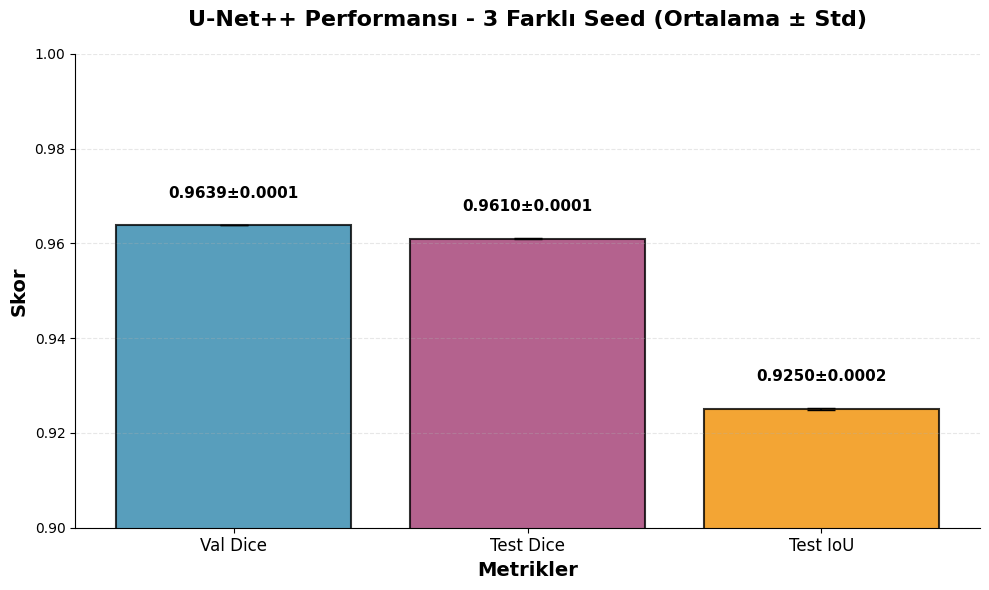

U-Net++ Sonuç Özeti:
  Val Dice:  0.9639 ± 0.0001
  Test Dice: 0.9610 ± 0.0001
  Test IoU:  0.9250 ± 0.0002


In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Collect results from all seeds
test_dice_scores = []
test_iou_scores = []
val_dice_scores = []

for seed in SEEDS:
    BEST_MODEL_PATH = os.path.join(OUTPUT_DIR, f"best_unet_plusplus_seed{seed}.pt")
    LAST_MODEL_PATH = os.path.join(OUTPUT_DIR, f"last_unet_plusplus_seed{seed}.pt")
    
    # Load test results
    unetpp_model = smp.UnetPlusPlus(
        encoder_name="efficientnet-b3",
        encoder_weights=None,
        in_channels=3,
        classes=1,
    ).to(DEVICE)
    unetpp_model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=DEVICE))
    unetpp_model.eval()

    test_d, test_i = [], []
    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            logits = unetpp_model(images)
            d, iou = calculate_metrics(logits, masks, threshold=0.5)
            test_d.append(d)
            test_i.append(iou)
    
    test_dice_scores.append(np.mean(test_d))
    test_iou_scores.append(np.mean(test_i))
    
    # Get validation best dice
    ckpt = torch.load(LAST_MODEL_PATH, map_location="cpu")
    val_dice_scores.append(ckpt["best_dice"])

# Calculate statistics
mean_test_dice = np.mean(test_dice_scores)
std_test_dice = np.std(test_dice_scores)
mean_test_iou = np.mean(test_iou_scores)
std_test_iou = np.std(test_iou_scores)
mean_val_dice = np.mean(val_dice_scores)
std_val_dice = np.std(val_dice_scores)

# Create bar chart
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

metrics = ['Val Dice', 'Test Dice', 'Test IoU']
means = [mean_val_dice, mean_test_dice, mean_test_iou]
stds = [std_val_dice, std_test_dice, std_test_iou]

x = np.arange(len(metrics))
bars = ax.bar(x, means, yerr=stds, capsize=10, alpha=0.8, 
               color=['#2E86AB', '#A23B72', '#F18F01'], 
               edgecolor='black', linewidth=1.5)

# Add value labels on bars
for i, (bar, mean, std) in enumerate(zip(bars, means, stds)):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + std + 0.005,
            f'{mean:.4f}±{std:.4f}',
            ha='center', va='bottom', fontsize=11, fontweight='bold')

ax.set_xlabel('Metrikler', fontsize=14, fontweight='bold')
ax.set_ylabel('Skor', fontsize=14, fontweight='bold')
ax.set_title('U-Net++ Performansı - 3 Farklı Seed (Ortalama ± Std)', 
             fontsize=16, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(metrics, fontsize=12)
ax.set_ylim([0.90, 1.0])
ax.grid(axis='y', alpha=0.3, linestyle='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'unetpp_performance_comparison.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

print("U-Net++ Sonuç Özeti:")
print(f"  Val Dice:  {mean_val_dice:.4f} ± {std_val_dice:.4f}")
print(f"  Test Dice: {mean_test_dice:.4f} ± {std_test_dice:.4f}")
print(f"  Test IoU:  {mean_test_iou:.4f} ± {std_test_iou:.4f}")

### 2. Training Curves with Shaded Standard Deviation

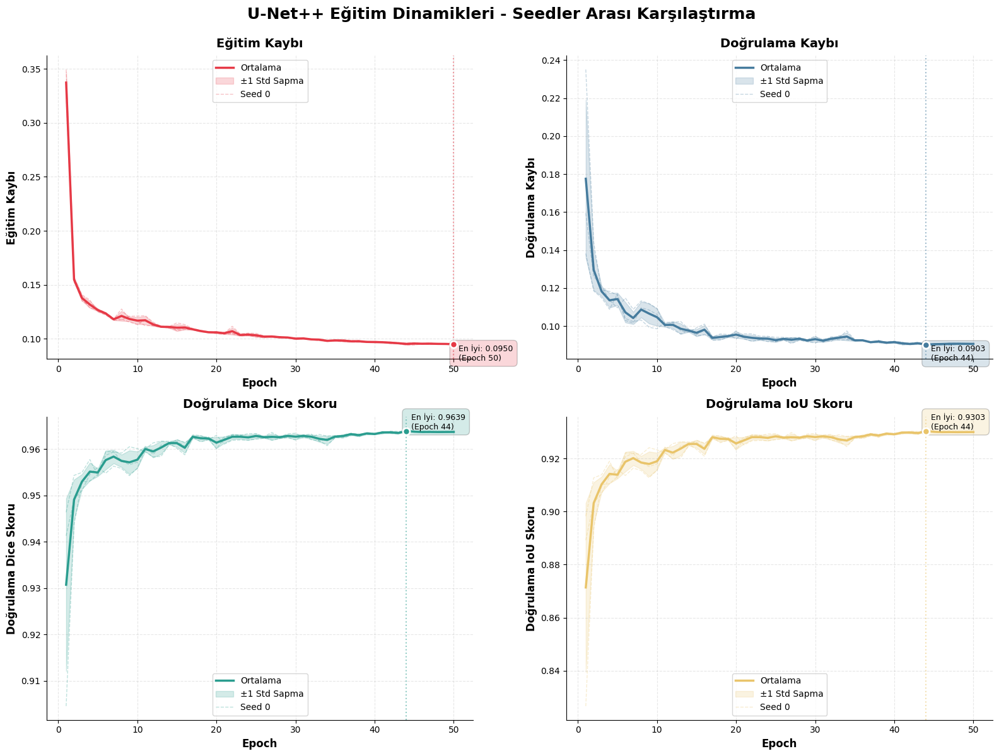

In [9]:
# Load training histories from all seeds
histories = []
for seed in SEEDS:
    last_path = os.path.join(OUTPUT_DIR, f"last_unet_plusplus_seed{seed}.pt")
    ckpt = torch.load(last_path, map_location="cpu")
    histories.append(ckpt["history"])

# Calculate mean and std across seeds
max_epochs = max([len(h["train_loss"]) for h in histories])
epochs = np.arange(1, max_epochs + 1)

# Aggregate metrics
metrics_to_plot = ['train_loss', 'val_loss', 'val_dice', 'val_iou']
aggregated = {}

for metric in metrics_to_plot:
    values = []
    for h in histories:
        if len(h[metric]) < max_epochs:
            # Pad with last value if needed
            padded = h[metric] + [h[metric][-1]] * (max_epochs - len(h[metric]))
        else:
            padded = h[metric]
        values.append(padded)
    
    aggregated[metric] = {
        'mean': np.mean(values, axis=0),
        'std': np.std(values, axis=0),
    }

# Create 2x2 subplot
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

plot_configs = [
    ('train_loss', 'Eğitim Kaybı', '#E63946', False),
    ('val_loss', 'Doğrulama Kaybı', '#457B9D', False),
    ('val_dice', 'Doğrulama Dice Skoru', '#2A9D8F', True),
    ('val_iou', 'Doğrulama IoU Skoru', '#E9C46A', True),
]

for ax, (metric, title, color, maximize) in zip(axes, plot_configs):
    mean = aggregated[metric]['mean']
    std = aggregated[metric]['std']
    
    # Plot mean line
    ax.plot(epochs, mean, color=color, linewidth=2.5, label='Ortalama', zorder=3)
    
    # Plot shaded std region
    ax.fill_between(epochs, mean - std, mean + std, 
                     color=color, alpha=0.2, label='±1 Std Sapma')
    
    # Plot individual seeds with thin lines
    for i, h in enumerate(histories):
        values = h[metric]
        if len(values) < max_epochs:
            values = values + [values[-1]] * (max_epochs - len(values))
        ax.plot(epochs, values, color=color, alpha=0.3, linewidth=1, 
                linestyle='--', label=f'Seed {SEEDS[i]}' if i == 0 else '')
    
    ax.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax.set_ylabel(title, fontsize=12, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold', pad=10)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.legend(fontsize=10)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Add best value annotation
    if maximize:
        best_val = np.max(mean)
        best_epoch = np.argmax(mean) + 1
        ax.axvline(best_epoch, color=color, linestyle=':', alpha=0.5)
        ax.plot(best_epoch, best_val, 'o', color=color, markersize=8, 
                markeredgecolor='white', markeredgewidth=2, zorder=4)
        ax.text(best_epoch, best_val, f'  En İyi: {best_val:.4f}\n  (Epoch {best_epoch})',
                fontsize=9, va='bottom', ha='left', bbox=dict(boxstyle='round,pad=0.5', 
                facecolor=color, alpha=0.2))
    else:
        best_val = np.min(mean)
        best_epoch = np.argmin(mean) + 1
        ax.axvline(best_epoch, color=color, linestyle=':', alpha=0.5)
        ax.plot(best_epoch, best_val, 'o', color=color, markersize=8,
                markeredgecolor='white', markeredgewidth=2, zorder=4)
        ax.text(best_epoch, best_val, f'  En İyi: {best_val:.4f}\n  (Epoch {best_epoch})',
                fontsize=9, va='top', ha='left', bbox=dict(boxstyle='round,pad=0.5',
                facecolor=color, alpha=0.2))

fig.suptitle('U-Net++ Eğitim Dinamikleri - Seedler Arası Karşılaştırma', 
             fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'unetpp_training_curves.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

### 3. Per-Image Performance Distribution (Box Plot)

/tmp/ipykernel_24/2782689992.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = axes[0].boxplot(all_seeds_dice, labels=[f'Seed {s}' for s in SEEDS],
/tmp/ipykernel_24/2782689992.py:68: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = axes[1].boxplot(all_seeds_iou, labels=[f'Seed {s}' for s in SEEDS],


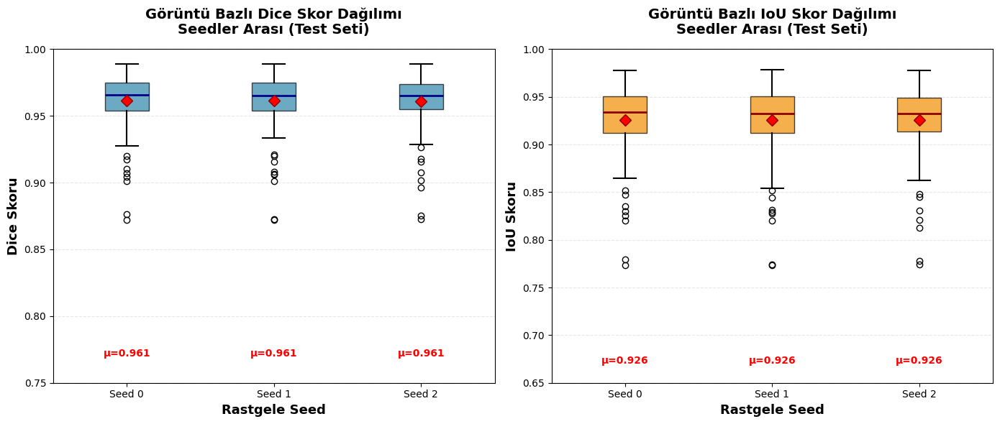


Görüntü Bazlı İstatistikler (Test Seti):
Seed 0:
  Dice: 0.9612±0.0191 (min=0.8723, max=0.9888)
  IoU:  0.9259±0.0343

Seed 1:
  Dice: 0.9612±0.0190 (min=0.8722, max=0.9891)
  IoU:  0.9260±0.0340

Seed 2:
  Dice: 0.9611±0.0190 (min=0.8725, max=0.9888)
  IoU:  0.9258±0.0340



In [10]:
# Compute per-image Dice and IoU for all seeds
all_seeds_dice = []
all_seeds_iou = []

for seed in SEEDS:
    BEST_MODEL_PATH = os.path.join(OUTPUT_DIR, f"best_unet_plusplus_seed{seed}.pt")
    
    unetpp_model = smp.UnetPlusPlus(
        encoder_name="efficientnet-b3",
        encoder_weights=None,
        in_channels=3,
        classes=1,
    ).to(DEVICE)
    unetpp_model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=DEVICE))
    unetpp_model.eval()
    
    per_image_dice = []
    per_image_iou = []
    
    with torch.no_grad():
        for idx in range(len(test_ds)):
            x, y = test_ds[idx]
            x = x.unsqueeze(0).to(DEVICE)
            y = y.unsqueeze(0).to(DEVICE)
            
            logits = unetpp_model(x)
            pred = (torch.sigmoid(logits) > 0.5).float()
            
            # Calculate per-image metrics
            inter = (pred * y).sum()
            union = pred.sum() + y.sum() - inter
            dice = (2.0 * inter / (pred.sum() + y.sum() + 1e-8)).item()
            iou = (inter / (union + 1e-8)).item()
            
            per_image_dice.append(dice)
            per_image_iou.append(iou)
    
    all_seeds_dice.append(per_image_dice)
    all_seeds_iou.append(per_image_iou)

# Create box plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Dice box plot
bp1 = axes[0].boxplot(all_seeds_dice, labels=[f'Seed {s}' for s in SEEDS],
                       patch_artist=True, showmeans=True,
                       meanprops=dict(marker='D', markerfacecolor='red', 
                                     markeredgecolor='darkred', markersize=8),
                       boxprops=dict(facecolor='#2E86AB', alpha=0.7),
                       medianprops=dict(color='darkblue', linewidth=2),
                       whiskerprops=dict(linewidth=1.5),
                       capprops=dict(linewidth=1.5))

axes[0].set_ylabel('Dice Skoru', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Rastgele Seed', fontsize=13, fontweight='bold')
axes[0].set_title('Görüntü Bazlı Dice Skor Dağılımı\nSeedler Arası (Test Seti)', 
                  fontsize=14, fontweight='bold', pad=15)
axes[0].grid(axis='y', alpha=0.3, linestyle='--')
axes[0].set_ylim([0.75, 1.0])

# Add mean value text
for i, seed_scores in enumerate(all_seeds_dice):
    mean_val = np.mean(seed_scores)
    axes[0].text(i+1, 0.77, f'μ={mean_val:.3f}', ha='center', 
                fontsize=10, fontweight='bold', color='red')

# IoU box plot
bp2 = axes[1].boxplot(all_seeds_iou, labels=[f'Seed {s}' for s in SEEDS],
                       patch_artist=True, showmeans=True,
                       meanprops=dict(marker='D', markerfacecolor='red',
                                     markeredgecolor='darkred', markersize=8),
                       boxprops=dict(facecolor='#F18F01', alpha=0.7),
                       medianprops=dict(color='darkred', linewidth=2),
                       whiskerprops=dict(linewidth=1.5),
                       capprops=dict(linewidth=1.5))

axes[1].set_ylabel('IoU Skoru', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Rastgele Seed', fontsize=13, fontweight='bold')
axes[1].set_title('Görüntü Bazlı IoU Skor Dağılımı\nSeedler Arası (Test Seti)', 
                  fontsize=14, fontweight='bold', pad=15)
axes[1].grid(axis='y', alpha=0.3, linestyle='--')
axes[1].set_ylim([0.65, 1.0])

# Add mean value text
for i, seed_scores in enumerate(all_seeds_iou):
    mean_val = np.mean(seed_scores)
    axes[1].text(i+1, 0.67, f'μ={mean_val:.3f}', ha='center',
                fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'unetpp_score_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

# Print statistics
print("\nGörüntü Bazlı İstatistikler (Test Seti):")
print("="*60)
for i, seed in enumerate(SEEDS):
    dice_mean = np.mean(all_seeds_dice[i])
    dice_std = np.std(all_seeds_dice[i])
    dice_min = np.min(all_seeds_dice[i])
    dice_max = np.max(all_seeds_dice[i])
    
    iou_mean = np.mean(all_seeds_iou[i])
    iou_std = np.std(all_seeds_iou[i])
    
    print(f"Seed {seed}:")
    print(f"  Dice: {dice_mean:.4f}±{dice_std:.4f} (min={dice_min:.4f}, max={dice_max:.4f})")
    print(f"  IoU:  {iou_mean:.4f}±{iou_std:.4f}")
    print()

### 4. Qualitative Results Grid (Best Seed)

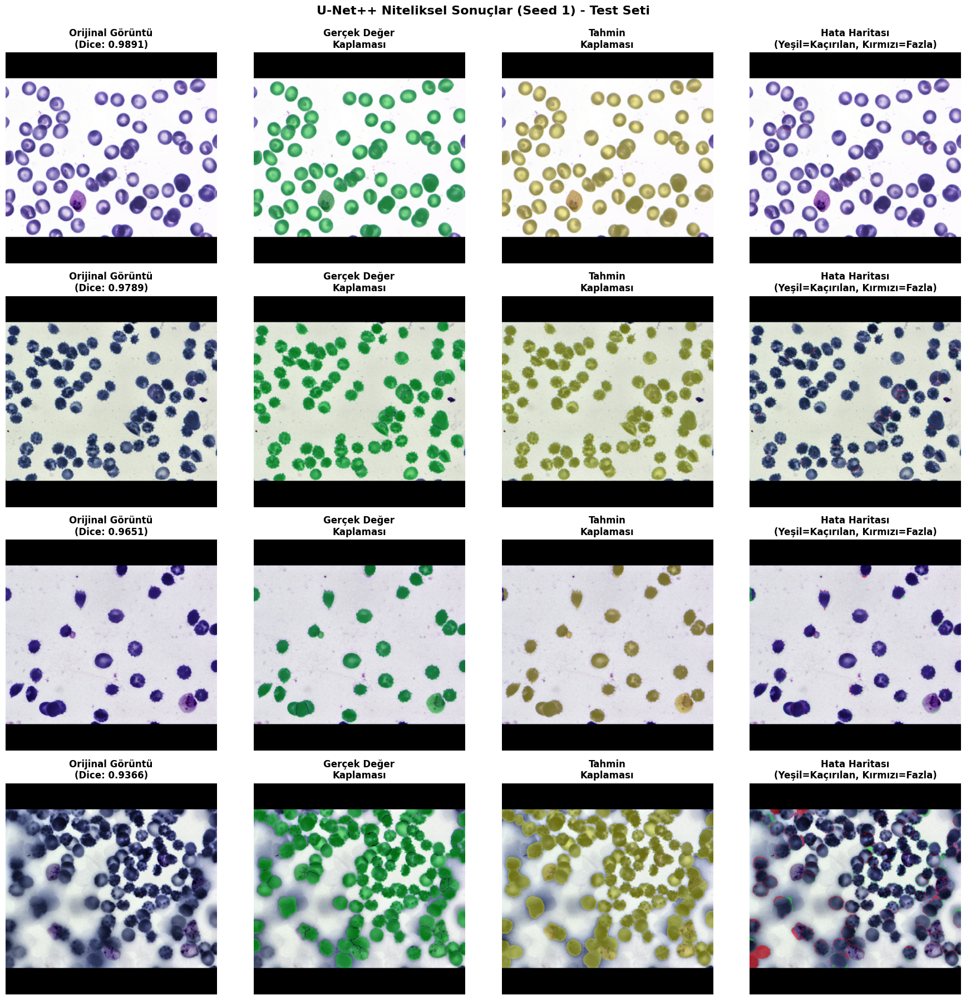

In [11]:
# Use best seed model (seed 0 typically)
best_seed = SEEDS[np.argmax([np.mean(scores) for scores in all_seeds_dice])]
BEST_MODEL_PATH = os.path.join(OUTPUT_DIR, f"best_unet_plusplus_seed{best_seed}.pt")

unetpp_model = smp.UnetPlusPlus(
    encoder_name="efficientnet-b3",
    encoder_weights=None,
    in_channels=3,
    classes=1,
).to(DEVICE)
unetpp_model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=DEVICE))
unetpp_model.eval()

# Select diverse samples: best, good, medium, challenging
seed_idx = SEEDS.index(best_seed)
dice_scores = all_seeds_dice[seed_idx]
sorted_indices = np.argsort(dice_scores)

sample_indices = [
    sorted_indices[-1],  # Best
    sorted_indices[-20], # Very good
    sorted_indices[len(sorted_indices)//2],  # Median
    sorted_indices[10],  # Challenging
]

# Create qualitative grid
fig, axes = plt.subplots(len(sample_indices), 4, figsize=(18, 4.5*len(sample_indices)))

MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
STD = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def denorm(img_t):
    img = img_t.permute(1, 2, 0).cpu().numpy().astype(np.float32)
    img = img * STD + MEAN
    return np.clip(img, 0, 1)

for row_idx, img_idx in enumerate(sample_indices):
    x, y = test_ds[img_idx]
    x_in = x.unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        logits = unetpp_model(x_in)
        pred_prob = torch.sigmoid(logits).cpu()[0, 0]
        pred_mask = (pred_prob > 0.5).float()
    
    img_denorm = denorm(x)
    gt_mask = y.cpu()[0].numpy()
    pred_mask_np = pred_mask.numpy()
    
    dice_score = dice_scores[img_idx]
    
    # Column 0: Original image
    axes[row_idx, 0].imshow(img_denorm)
    axes[row_idx, 0].set_title(f'Orijinal Görüntü\n(Dice: {dice_score:.4f})', 
                               fontsize=12, fontweight='bold')
    axes[row_idx, 0].axis('off')
    
    # Column 1: Ground truth overlay
    gt_overlay = img_denorm.copy()
    gt_mask_bool = gt_mask.astype(bool)
    gt_overlay[gt_mask_bool] = 0.6 * gt_overlay[gt_mask_bool] + 0.4 * np.array([0, 1, 0])
    axes[row_idx, 1].imshow(gt_overlay)
    axes[row_idx, 1].set_title('Gerçek Değer\nKaplaması', fontsize=12, fontweight='bold')
    axes[row_idx, 1].axis('off')
    
    # Column 2: Prediction overlay
    pred_overlay = img_denorm.copy()
    pred_mask_bool = pred_mask_np.astype(bool)
    pred_overlay[pred_mask_bool] = 0.6 * pred_overlay[pred_mask_bool] + 0.4 * np.array([1, 1, 0])
    axes[row_idx, 2].imshow(pred_overlay)
    axes[row_idx, 2].set_title('Tahmin\nKaplaması', fontsize=12, fontweight='bold')
    axes[row_idx, 2].axis('off')
    
    # Column 3: Error visualization
    error_vis = img_denorm.copy()
    # False Negatives (missed): Green
    fn_mask = (gt_mask == 1) & (pred_mask_np == 0)
    error_vis[fn_mask] = 0.5 * error_vis[fn_mask] + 0.5 * np.array([0, 1, 0])
    # False Positives (extra): Red
    fp_mask = (gt_mask == 0) & (pred_mask_np == 1)
    error_vis[fp_mask] = 0.5 * error_vis[fp_mask] + 0.5 * np.array([1, 0, 0])
    
    axes[row_idx, 3].imshow(error_vis)
    axes[row_idx, 3].set_title('Hata Haritası\n(Yeşil=Kaçırılan, Kırmızı=Fazla)', fontsize=12, fontweight='bold')
    axes[row_idx, 3].axis('off')

fig.suptitle(f'U-Net++ Niteliksel Sonuçlar (Seed {best_seed}) - Test Seti', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'unetpp_qualitative_results.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

# Instance Segmentation

Now we move from semantic segmentation to **instance segmentation**, where each blood cell gets its own unique ID.

## Pipeline:
1. **Derive instance masks** from binary semantic masks using watershed segmentation
2. **Convert to COCO format** for model training
3. **Train YOLOv8-Seg** - Fast, excellent API
4. **Train Mask R-CNN** - Classic two-stage approach
5. **Train Mask2Former** - SOTA transformer-based

## Install Dependencies & Setup for Instance Segmentation

In [12]:
# Install instance segmentation dependencies
!pip install -q ultralytics pycocotools

# For Detectron2 on Kaggle (Linux + CUDA)
import torch
TORCH_VERSION = torch.__version__.split('+')[0]
CUDA_VERSION = torch.version.cuda.replace('.', '') if torch.version.cuda else 'cpu'
print(f"PyTorch: {TORCH_VERSION}, CUDA: {CUDA_VERSION}")

# Install detectron2 (compatible with Kaggle's PyTorch version)
!pip install -q 'git+https://github.com/facebookresearch/detectron2.git'

print("Instance segmentation dependencies installed!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 50.7 MB/s eta 0:00:00
PyTorch: 2.8.0, CUDA: 126
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 12.3 MB/s eta 0:00:00
Instance segmentation dependencies installed!


In [13]:
import os
import cv2
import json
import numpy as np
from pathlib import Path
from scipy import ndimage
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from tqdm import tqdm
import matplotlib.pyplot as plt

# Paths
INSTANCE_OUTPUT_DIR = "/kaggle/working/blood_cell_instance_seg"
COCO_DIR = os.path.join(INSTANCE_OUTPUT_DIR, "coco_annotations")
YOLO_DIR = os.path.join(INSTANCE_OUTPUT_DIR, "yolo_dataset")

Path(INSTANCE_OUTPUT_DIR).mkdir(parents=True, exist_ok=True)
Path(COCO_DIR).mkdir(parents=True, exist_ok=True)
Path(YOLO_DIR).mkdir(parents=True, exist_ok=True)

print(f"Instance Output Dir: {INSTANCE_OUTPUT_DIR}")
print(f"COCO Dir: {COCO_DIR}")
print(f"YOLO Dir: {YOLO_DIR}")

Instance Output Dir: /kaggle/working/blood_cell_instance_seg
COCO Dir: /kaggle/working/blood_cell_instance_seg/coco_annotations
YOLO Dir: /kaggle/working/blood_cell_instance_seg/yolo_dataset


## Instance Mask Derivation using Watershed

Convert binary semantic masks to instance-level masks where each cell gets a unique ID.

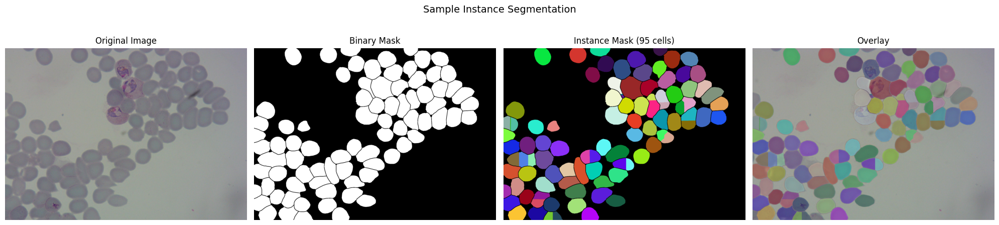

Detected 95 cell instances


In [14]:
def binary_mask_to_instances(binary_mask, min_distance=10, min_area=50):
    """
    Convert binary mask to instance mask using watershed segmentation.
    Return instance_mask: (H, W) with unique integer ID per instance (0=background)
    """
    binary_mask = (binary_mask > 0).astype(np.uint8)
    
    # Distance transform - distance from each foreground pixel to nearest background
    distance = ndimage.distance_transform_edt(binary_mask)
    
    # Find local maxima (cell centers)
    coords = peak_local_max(
        distance, 
        min_distance=min_distance,
        labels=binary_mask,
        exclude_border=False
    )
    
    # Create markers for watershed
    markers = np.zeros(distance.shape, dtype=np.int32)
    for i, (y, x) in enumerate(coords):
        markers[y, x] = i + 1
    
    # Apply watershed
    instance_mask = watershed(-distance, markers, mask=binary_mask)
    
    # Filter small instances
    unique_ids = np.unique(instance_mask)
    for uid in unique_ids:
        if uid == 0:
            continue
        area = np.sum(instance_mask == uid)
        if area < min_area:
            instance_mask[instance_mask == uid] = 0
    
    # Relabel to ensure consecutive IDs
    unique_ids = np.unique(instance_mask)
    unique_ids = unique_ids[unique_ids > 0]
    new_mask = np.zeros_like(instance_mask)
    for new_id, old_id in enumerate(unique_ids, start=1):
        new_mask[instance_mask == old_id] = new_id
    
    return new_mask


def visualize_instances(image, binary_mask, instance_mask, title=""):
    """Visualize original, binary mask, and color-coded instance mask."""
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    # Original image
    if image.max() > 1:
        image = image / 255.0
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")
    
    # Binary mask
    axes[1].imshow(binary_mask, cmap="gray")
    axes[1].set_title("Binary Mask")
    axes[1].axis("off")
    
    # Instance mask with random colors
    num_instances = instance_mask.max()
    if num_instances > 0:
        np.random.seed(42)
        colors = np.random.rand(num_instances + 1, 3)
        colors[0] = [0, 0, 0]  # Background is black
        colored_mask = colors[instance_mask]
    else:
        colored_mask = np.zeros((*instance_mask.shape, 3))
    
    axes[2].imshow(colored_mask)
    axes[2].set_title(f"Instance Mask ({num_instances} cells)")
    axes[2].axis("off")
    
    # Overlay on original
    overlay = image.copy() if image.ndim == 3 else np.stack([image]*3, axis=-1)
    overlay = overlay.astype(np.float32)
    if overlay.max() > 1:
        overlay = overlay / 255.0
    
    alpha = 0.4
    mask_overlay = overlay.copy()
    for i in range(1, num_instances + 1):
        mask_region = instance_mask == i
        color = colors[i] if num_instances > 0 else [1, 0, 0]
        for c in range(3):
            mask_overlay[:, :, c] = np.where(
                mask_region,
                (1 - alpha) * overlay[:, :, c] + alpha * color[c],
                mask_overlay[:, :, c]
            )
    
    axes[3].imshow(mask_overlay)
    axes[3].set_title("Overlay")
    axes[3].axis("off")
    
    if title:
        fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()
    
    return num_instances


# Test on a sample image
sample_img_path, sample_mask_path = train_pairs[0]
sample_img = cv2.imread(sample_img_path)
sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
sample_binary = cv2.imread(sample_mask_path, cv2.IMREAD_GRAYSCALE)
sample_binary = (sample_binary > 0).astype(np.uint8)

sample_instance = binary_mask_to_instances(sample_binary, min_distance=8, min_area=30)
num_cells = visualize_instances(sample_img, sample_binary, sample_instance, title="Sample Instance Segmentation")
print(f"Detected {num_cells} cell instances")

## Convert Instance Masks to COCO Format

Create COCO-format JSON annotations for Detectron2 and YOLO training.

In [15]:
from pycocotools import mask as mask_utils

def instance_mask_to_coco_annotations(instance_mask, image_id, annotation_id_start, category_id=1):
    """
    Convert instance mask to COCO format annotations.
    Return list of COCO annotation dicts
    """
    annotations = []
    unique_ids = np.unique(instance_mask)
    unique_ids = unique_ids[unique_ids > 0]  # Exclude background
    
    for idx, inst_id in enumerate(unique_ids):
        binary_mask = (instance_mask == inst_id).astype(np.uint8)
        
        # Get bounding box
        ys, xs = np.where(binary_mask)
        if len(xs) == 0 or len(ys) == 0:
            continue
        x_min, x_max = int(xs.min()), int(xs.max())
        y_min, y_max = int(ys.min()), int(ys.max())
        width = x_max - x_min + 1
        height = y_max - y_min + 1
        

        area = int(binary_mask.sum())

        rle = mask_utils.encode(np.asfortranarray(binary_mask))
        rle['counts'] = rle['counts'].decode('utf-8')  # JSON serializable
        
        # Also create polygon (for visualization)
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        segmentation = []
        for contour in contours:
            if len(contour) >= 3:
                contour = contour.flatten().tolist()
                if len(contour) >= 6:  # At least 3 points (x,y pairs)
                    segmentation.append(contour)
        
        if not segmentation:
            continue
        
        annotation = {
            "id": annotation_id_start + idx,
            "image_id": image_id,
            "category_id": category_id,
            "segmentation": segmentation,
            "area": area,
            "bbox": [x_min, y_min, width, height],  # COCO format: [x, y, width, height]
            "iscrowd": 0,
        }
        annotations.append(annotation)
    
    return annotations


def create_coco_dataset(image_pairs, split_name, min_distance=8, min_area=30):
    """
    Create COCO format dataset from image-mask pairs.
    Return COCO format dict
    """
    coco_dict = {
        "info": {
            "description": "BCCD Blood Cell Dataset - Instance Segmentation",
            "version": "1.0",
            "year": 2025,
            "contributor": "Blood Cell Segmentation Project",
            "date_created": "2025/12/11"
        },
        "licenses": [],
        "images": [],
        "annotations": [],
        "categories": [
            {"id": 1, "name": "blood_cell", "supercategory": "cell"}
        ]
    }
    
    annotation_id = 1
    
    for img_id, (img_path, mask_path) in enumerate(tqdm(image_pairs, desc=f"Processing {split_name}")):
        # Load image for dimensions
        img = cv2.imread(img_path)
        height, width = img.shape[:2]
        
        file_name = os.path.basename(img_path)
        coco_dict["images"].append({
            "id": img_id,
            "file_name": file_name,
            "width": width,
            "height": height,
            "path": img_path,  # Extra field for convenience
        })
        
        # Load and convert mask
        binary_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        binary_mask = (binary_mask > 0).astype(np.uint8)
        
        # Convert to instances
        instance_mask = binary_mask_to_instances(binary_mask, min_distance=min_distance, min_area=min_area)
        
        # Convert to COCO annotations
        annotations = instance_mask_to_coco_annotations(
            instance_mask, 
            image_id=img_id,
            annotation_id_start=annotation_id,
            category_id=1
        )
        
        coco_dict["annotations"].extend(annotations)
        annotation_id += len(annotations)
    
    return coco_dict


# Create COCO datasets for train, val, test
print("Creating COCO format datasets...")

train_coco = create_coco_dataset(train_pairs, "train", min_distance=8, min_area=30)
val_coco = create_coco_dataset(val_pairs, "val", min_distance=8, min_area=30)
test_coco = create_coco_dataset(test_pairs, "test", min_distance=8, min_area=30)

# Save COCO JSON files
train_coco_path = os.path.join(COCO_DIR, "train_coco.json")
val_coco_path = os.path.join(COCO_DIR, "val_coco.json")
test_coco_path = os.path.join(COCO_DIR, "test_coco.json")

with open(train_coco_path, "w") as f:
    json.dump(train_coco, f)
with open(val_coco_path, "w") as f:
    json.dump(val_coco, f)
with open(test_coco_path, "w") as f:
    json.dump(test_coco, f)

print(f"\nCOCO datasets created:")
print(f"  Train: {len(train_coco['images'])} images, {len(train_coco['annotations'])} annotations")
print(f"  Val: {len(val_coco['images'])} images, {len(val_coco['annotations'])} annotations")
print(f"  Test: {len(test_coco['images'])} images, {len(test_coco['annotations'])} annotations")

Creating COCO format datasets...


Processing test: 100%|██████████| 159/159 [04:56<00:00,  1.86s/it]



COCO datasets created:
  Train: 994 images, 78977 annotations
  Val: 175 images, 14656 annotations
  Test: 159 images, 13591 annotations


### Load Existing COCO JSON Files (Skip Regeneration)

If you already created COCO files in a previous session, use this cell to reload them.

In [16]:
# Load existing COCO JSON files from previous session
import json
import os

# Check if COCO files exist
train_coco_path = os.path.join(COCO_DIR, "train_coco.json")
val_coco_path = os.path.join(COCO_DIR, "val_coco.json")
test_coco_path = os.path.join(COCO_DIR, "test_coco.json")

files_exist = all([
    os.path.exists(train_coco_path),
    os.path.exists(val_coco_path),
    os.path.exists(test_coco_path)
])

if files_exist:
    print("Found existing COCO JSON files. Loading...")
    
    # Load COCO JSON files
    with open(train_coco_path, "r") as f:
        train_coco = json.load(f)
    
    with open(val_coco_path, "r") as f:
        val_coco = json.load(f)
    
    with open(test_coco_path, "r") as f:
        test_coco = json.load(f)
    
    # Fix missing 'info' field if needed (for compatibility)
    coco_info = {
        "description": "BCCD Blood Cell Dataset - Instance Segmentation",
        "version": "1.0",
        "year": 2025,
        "contributor": "Blood Cell Segmentation Project",
        "date_created": "2025/12/11"
    }
    
    for coco_data, json_path in [(train_coco, train_coco_path), 
                                   (val_coco, val_coco_path), 
                                   (test_coco, test_coco_path)]:
        if "info" not in coco_data:
            coco_data["info"] = coco_info
            coco_data["licenses"] = []
            # Save updated JSON
            with open(json_path, "w") as f:
                json.dump(coco_data, f)
    
    # Print summary
    print("\nCOCO Dataset Summary:")
    print(f"  Train: {len(train_coco['images'])} images, {len(train_coco['annotations'])} instances")
    print(f"  Val:   {len(val_coco['images'])} images, {len(val_coco['annotations'])} instances")
    print(f"  Test:  {len(test_coco['images'])} images, {len(test_coco['annotations'])} instances")
    print(f"\n  Categories: {train_coco['categories']}")
    print(f"\nVariables loaded: train_coco, val_coco, test_coco")
    print(f"File paths: train_coco_path, val_coco_path, test_coco_path")
    
else:
    print("COCO JSON files not found!")
    print(f"   Looking in: {COCO_DIR}")
    print("\n   Please run the 'Create COCO datasets' cell first to generate:")
    print("   - train_coco.json")
    print("   - val_coco.json")
    print("   - test_coco.json")

✅ Found existing COCO JSON files. Loading...

COCO Dataset Summary:
  Train: 994 images, 78977 instances
  Val:   175 images, 14656 instances
  Test:  159 images, 13591 instances

  Categories: [{'id': 1, 'name': 'blood_cell', 'supercategory': 'cell'}]

Variables loaded: train_coco, val_coco, test_coco
File paths: train_coco_path, val_coco_path, test_coco_path


In [17]:
# Create YOLO format dataset for YOLOv8-Seg
import shutil

def create_yolo_dataset(coco_dict, split_name, yolo_base_dir):
    """
    Convert COCO format to YOLO segmentation format.
    YOLO format: class_id x1 y1 x2 y2 ... (normalized polygon coordinates)
    """
    images_dir = os.path.join(yolo_base_dir, "images", split_name)
    labels_dir = os.path.join(yolo_base_dir, "labels", split_name)
    
    Path(images_dir).mkdir(parents=True, exist_ok=True)
    Path(labels_dir).mkdir(parents=True, exist_ok=True)
    
    # Create image_id to annotations mapping
    img_to_anns = {}
    for ann in coco_dict["annotations"]:
        img_id = ann["image_id"]
        if img_id not in img_to_anns:
            img_to_anns[img_id] = []
        img_to_anns[img_id].append(ann)
    
    for img_info in tqdm(coco_dict["images"], desc=f"Creating YOLO {split_name}"):
        img_id = img_info["id"]
        img_path = img_info["path"]
        img_width = img_info["width"]
        img_height = img_info["height"]
        
        # Copy image to YOLO directory
        dst_img_path = os.path.join(images_dir, os.path.basename(img_path))
        if not os.path.exists(dst_img_path):
            shutil.copy(img_path, dst_img_path)
        
        # Create label file
        label_filename = os.path.splitext(os.path.basename(img_path))[0] + ".txt"
        label_path = os.path.join(labels_dir, label_filename)
        
        annotations = img_to_anns.get(img_id, [])
        
        with open(label_path, "w") as f:
            for ann in annotations:
                class_id = 0  # Single class (blood_cell)
                
                # Get the first polygon segmentation
                if ann["segmentation"]:
                    seg = ann["segmentation"][0]
                    # Normalize coordinates
                    normalized_seg = []
                    for i in range(0, len(seg), 2):
                        x = seg[i] / img_width
                        y = seg[i + 1] / img_height
                        normalized_seg.extend([x, y])
                    
                    # YOLO format: class_id followed by normalized polygon coordinates
                    line = f"{class_id} " + " ".join([f"{coord:.6f}" for coord in normalized_seg])
                    f.write(line + "\n")


# Create YOLO datasets
print("Creating YOLO format datasets...")
create_yolo_dataset(train_coco, "train", YOLO_DIR)
create_yolo_dataset(val_coco, "val", YOLO_DIR)
create_yolo_dataset(test_coco, "test", YOLO_DIR)

# Create YOLO data.yaml
yaml_content = f"""
path: {YOLO_DIR}
train: images/train
val: images/val
test: images/test

names:
  0: blood_cell

nc: 1
"""

yaml_path = os.path.join(YOLO_DIR, "data.yaml")
with open(yaml_path, "w") as f:
    f.write(yaml_content)

print(f"\nYOLO dataset created at: {YOLO_DIR}")
print(f"data.yaml saved at: {yaml_path}")

Creating YOLO format datasets...


Creating YOLO test: 100%|██████████| 159/159 [00:01<00:00, 81.73it/s]


YOLO dataset created at: /kaggle/working/blood_cell_instance_seg/yolo_dataset
data.yaml saved at: /kaggle/working/blood_cell_instance_seg/yolo_dataset/data.yaml


## YOLOv8-Seg Training

Train YOLOv8 segmentation model - fast, accurate, and easy to use.

In [18]:
from ultralytics import YOLO
import torch
import time
from sklearn.metrics import roc_auc_score, precision_score, accuracy_score, recall_score, f1_score
import json
import cv2

# Check GPU availability
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Training configuration
YOLO_EPOCHS = 50
YOLO_IMGSZ = 640
YOLO_BATCH = 8

print(f"\nYOLOv8-Seg Training Config:")
print(f"  Epochs: {YOLO_EPOCHS}")
print(f"  Image Size: {YOLO_IMGSZ}")
print(f"  Batch Size: {YOLO_BATCH}")
print(f"  Seeds: {SEEDS}")

# Storage for all seed results
yolov8_seed_results = []

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
CUDA available: True
GPU: Tesla P100-PCIE-16GB

YOLOv8-Seg Training Config:
  Epochs: 50
  Image Size: 640
  Batch Size: 8
  Seeds: [0, 1, 2]


In [19]:
# Train YOLOv8-Seg with multiple seeds
for seed in SEEDS:
    print(f"\n{'='*60}")
    print(f"YOLOv8-Seg training for seed {seed}")
    print('='*60)
    
    # Set seed for reproducibility
    set_seed(seed)
    
    # Initialize YOLOv8m-seg for this seed
    yolo_model = YOLO("yolov8m-seg.pt")  # Pre-trained on COCO
    
    # Train with seed
    yolo_results = yolo_model.train(
        data=yaml_path,
        epochs=YOLO_EPOCHS,
        imgsz=YOLO_IMGSZ,
        batch=YOLO_BATCH,
        patience=10,
        save=True,
        device=0,
        project=INSTANCE_OUTPUT_DIR,
        name=f"yolov8_seg_seed{seed}",
        exist_ok=True,
        pretrained=True,
        optimizer="AdamW",
        lr0=0.001,
        lrf=0.01,
        momentum=0.937,
        weight_decay=0.0005,
        warmup_epochs=3,
        mosaic=1.0,
        mixup=0.0,
        copy_paste=0.1,
        degrees=10.0,
        translate=0.1,
        scale=0.5,
        shear=2.0,
        flipud=0.5,
        fliplr=0.5,
        verbose=True,
        seed=seed,
        deterministic=True,
    )
    
    print(f"\n[YOLOv8-Seg seed={seed}] Training completed!")
    
    # Evaluate on validation set
    yolo_best_path = os.path.join(INSTANCE_OUTPUT_DIR, f"yolov8_seg_seed{seed}", "weights", "best.pt")
    yolo_eval_model = YOLO(yolo_best_path)
    
    print(f"\n[YOLOv8-Seg seed={seed}] Evaluating on validation set...")
    val_metrics = yolo_eval_model.val(
        data=yaml_path,
        split="val",
        imgsz=YOLO_IMGSZ,
        batch=YOLO_BATCH,
        device=0,
        verbose=False,
    )
    
    # Evaluate on test set
    print(f"[YOLOv8-Seg seed={seed}] Evaluating on test set...")
    test_metrics = yolo_eval_model.val(
        data=yaml_path,
        split="test",
        imgsz=YOLO_IMGSZ,
        batch=YOLO_BATCH,
        device=0,
        verbose=False,
    )
    
    # Calculate FPS (frames per second) on test set
    test_img_dir = os.path.join(YOLO_DIR, "images", "test")
    test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir) if f.endswith(('.jpg', '.png'))][:50]
    
    start_time = time.time()
    for img_path in test_images:
        _ = yolo_eval_model.predict(img_path, verbose=False, imgsz=YOLO_IMGSZ)
    end_time = time.time()
    fps = len(test_images) / (end_time - start_time)
    
    # Extract speed metrics from test_metrics
    speed_preprocess = test_metrics.speed['preprocess'] if hasattr(test_metrics, 'speed') else 0
    speed_inference = test_metrics.speed['inference'] if hasattr(test_metrics, 'speed') else 0
    speed_postprocess = test_metrics.speed['postprocess'] if hasattr(test_metrics, 'speed') else 0
    
    # Calculate additional metrics from predictions
    print(f"[YOLOv8-Seg seed={seed}] Calculating additional metrics...")
    
    # Get predictions and ground truth for metric calculation
    all_pred_masks = []
    all_gt_masks = []
    
    # Load test images and generate predictions
    test_labels_dir = os.path.join(YOLO_DIR, "labels", "test")
    for img_path in test_images[:20]:
        # Predict
        results = yolo_eval_model.predict(img_path, verbose=False, imgsz=YOLO_IMGSZ)

        img = cv2.imread(img_path)
        h, w = img.shape[:2]

        pred_mask = np.zeros((h, w), dtype=np.uint8)
        if results[0].masks is not None:
            for mask in results[0].masks.data:
                mask_resized = cv2.resize(mask.cpu().numpy(), (w, h))
                pred_mask = np.maximum(pred_mask, (mask_resized > 0.5).astype(np.uint8))
        
        # Load ground truth mask
        img_name = os.path.basename(img_path)
        label_path = os.path.join(test_labels_dir, img_name.replace('.jpg', '.txt').replace('.png', '.txt'))
        gt_mask = np.zeros((h, w), dtype=np.uint8)
        
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) > 1:
                        coords = np.array([float(x) for x in parts[1:]]).reshape(-1, 2)
                        coords[:, 0] *= w
                        coords[:, 1] *= h
                        coords = coords.astype(np.int32)
                        cv2.fillPoly(gt_mask, [coords], 1)
        
        all_pred_masks.append(pred_mask.flatten())
        all_gt_masks.append(gt_mask.flatten())
    
    # Flatten all masks for metric calculation
    all_pred_flat = np.concatenate(all_pred_masks)
    all_gt_flat = np.concatenate(all_gt_masks)
    
    # Calculate pixel-level metrics
    pixel_accuracy = accuracy_score(all_gt_flat, all_pred_flat)
    pixel_precision = precision_score(all_gt_flat, all_pred_flat, zero_division=0)
    pixel_recall = recall_score(all_gt_flat, all_pred_flat, zero_division=0)
    pixel_f1 = f1_score(all_gt_flat, all_pred_flat, zero_division=0)
    
    # Calculate ROC-AUC (using probability scores)
    try:
        # For binary classification, we can use the mask confidence as probability
        roc_auc = roc_auc_score(all_gt_flat, all_pred_flat) if len(np.unique(all_gt_flat)) > 1 else 0.0
    except:
        roc_auc = 0.0
    
    # Store comprehensive results
    seed_result = {
        "seed": seed,
        "model": "YOLOv8-Seg",
        
        # Validation metrics
        "val_map50_box": float(val_metrics.box.map50),
        "val_map_box": float(val_metrics.box.map),
        "val_map50_mask": float(val_metrics.seg.map50),
        "val_map_mask": float(val_metrics.seg.map),
        
        # Test metrics
        "test_map50_box": float(test_metrics.box.map50),
        "test_map_box": float(test_metrics.box.map),
        "test_map50_mask": float(test_metrics.seg.map50),
        "test_map_mask": float(test_metrics.seg.map),
        
        # Additional metrics
        "pixel_accuracy": float(pixel_accuracy),
        "pixel_precision": float(pixel_precision),
        "pixel_recall": float(pixel_recall),
        "pixel_f1": float(pixel_f1),
        "roc_auc": float(roc_auc),
        
        # Speed metrics
        "fps": float(fps),
        "speed_preprocess_ms": float(speed_preprocess),
        "speed_inference_ms": float(speed_inference),
        "speed_postprocess_ms": float(speed_postprocess),
        "total_inference_time_ms": float(speed_preprocess + speed_inference + speed_postprocess),
    }
    
    yolov8_seed_results.append(seed_result)
    
    print(f"\n[YOLOv8-Seg seed={seed}] Results Summary:")
    print(f"  Val mAP50 (Mask): {seed_result['val_map50_mask']:.4f}")
    print(f"  Test mAP50 (Mask): {seed_result['test_map50_mask']:.4f}")
    print(f"  Test mAP50-95 (Mask): {seed_result['test_map_mask']:.4f}")
    print(f"  Pixel Accuracy: {seed_result['pixel_accuracy']:.4f}")
    print(f"  Pixel Precision: {seed_result['pixel_precision']:.4f}")
    print(f"  Pixel Recall: {seed_result['pixel_recall']:.4f}")
    print(f"  Pixel F1: {seed_result['pixel_f1']:.4f}")
    print(f"  ROC-AUC: {seed_result['roc_auc']:.4f}")
    print(f"  FPS: {seed_result['fps']:.2f}")
    print(f"  Total Inference Time: {seed_result['total_inference_time_ms']:.2f}ms")

print("\n" + "="*60)
print("YOLOv8-Seg training completed for all seeds!")
print("="*60)

# Save results to JSON file
results_path = os.path.join(INSTANCE_OUTPUT_DIR, "yolov8_seed_results.json")
with open(results_path, 'w') as f:
    json.dump(yolov8_seed_results, f, indent=2)
print(f"\nResults saved to: {results_path}")

# Print summary statistics across seeds
print("\n" + "="*60)
print("YOLOv8-Seg Summary Across Seeds:")
print("="*60)
metrics_to_summarize = ['test_map50_mask', 'test_map_mask', 'pixel_accuracy', 'pixel_precision', 
                         'pixel_recall', 'pixel_f1', 'roc_auc', 'fps']
for metric in metrics_to_summarize:
    values = [r[metric] for r in yolov8_seed_results]
    print(f"{metric}: {np.mean(values):.4f} ± {np.std(values):.4f} (min: {np.min(values):.4f}, max: {np.max(values):.4f})")


YOLOv8-Seg training for seed 0

=== Setting seed 0 ===
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/blood_cell_instance_seg/yolo_dataset/data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_seg_seed0, nbs=64, nms=False


=== YOLOv8-Seg Detailed Results by Seed ===
   seed       model  val_map50_box  val_map_box  val_map50_mask  val_map_mask  test_map50_box  test_map_box  test_map50_mask  test_map_mask  pixel_accuracy  pixel_precision  pixel_recall  pixel_f1   roc_auc        fps  speed_preprocess_ms  speed_inference_ms  speed_postprocess_ms  total_inference_time_ms
0     0  YOLOv8-Seg       0.937814     0.809249        0.938409      0.735094        0.925327      0.790379         0.928678       0.709752        0.935160         0.867661      0.939996  0.902381  0.936446  12.831155             3.567943           19.685582             11.779831                35.033356
1     1  YOLOv8-Seg       0.938103     0.806291        0.937834      0.734114        0.925861      0.787201         0.927338       0.708440        0.935034         0.865436      0.942826  0.902475  0.937106  12.975529             3.390920           26.063650             10.083518                39.538087
2     2  YOLOv8-Seg       0.937881   

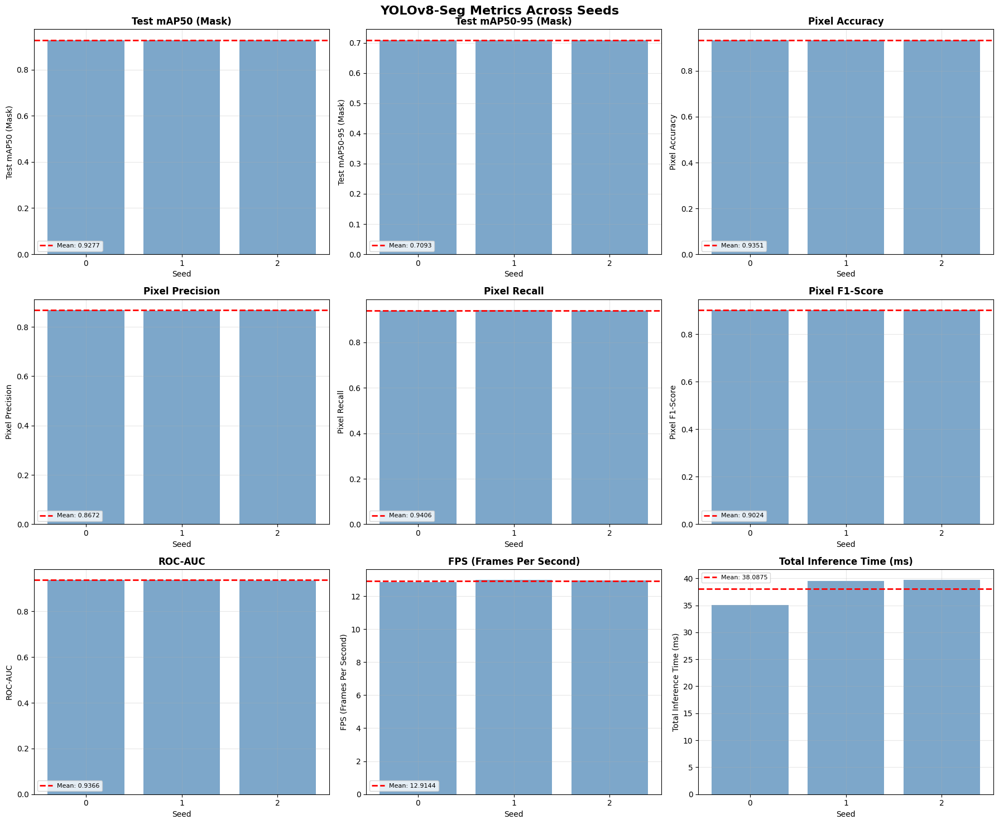


Visualization saved to: /kaggle/working/blood_cell_instance_seg/yolov8_metrics_visualization.png


In [20]:
# Visualize YOLOv8-Seg metrics across seeds
import matplotlib.pyplot as plt
import pandas as pd

# Create DataFrame for easier analysis
yolov8_df = pd.DataFrame(yolov8_seed_results)

print("\n=== YOLOv8-Seg Detailed Results by Seed ===")
print(yolov8_df.to_string())

# Create comprehensive metrics visualization
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle('YOLOv8-Seg Metrics Across Seeds', fontsize=16, fontweight='bold')

# Define metrics to plot
plot_configs = [
    ('test_map50_mask', 'Test mAP50 (Mask)'),
    ('test_map_mask', 'Test mAP50-95 (Mask)'),
    ('pixel_accuracy', 'Pixel Accuracy'),
    ('pixel_precision', 'Pixel Precision'),
    ('pixel_recall', 'Pixel Recall'),
    ('pixel_f1', 'Pixel F1-Score'),
    ('roc_auc', 'ROC-AUC'),
    ('fps', 'FPS (Frames Per Second)'),
    ('total_inference_time_ms', 'Total Inference Time (ms)'),
]

for idx, (metric, title) in enumerate(plot_configs):
    ax = axes[idx // 3, idx % 3]
    values = [r[metric] for r in yolov8_seed_results]
    seeds = [r['seed'] for r in yolov8_seed_results]
    
    ax.bar(range(len(seeds)), values, color='steelblue', alpha=0.7)
    ax.axhline(y=np.mean(values), color='red', linestyle='--', linewidth=2, label=f'Mean: {np.mean(values):.4f}')
    ax.set_xlabel('Seed', fontsize=10)
    ax.set_ylabel(title, fontsize=10)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xticks(range(len(seeds)))
    ax.set_xticklabels(seeds)
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(INSTANCE_OUTPUT_DIR, 'yolov8_metrics_visualization.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\nVisualization saved to: {os.path.join(INSTANCE_OUTPUT_DIR, 'yolov8_metrics_visualization.png')}")

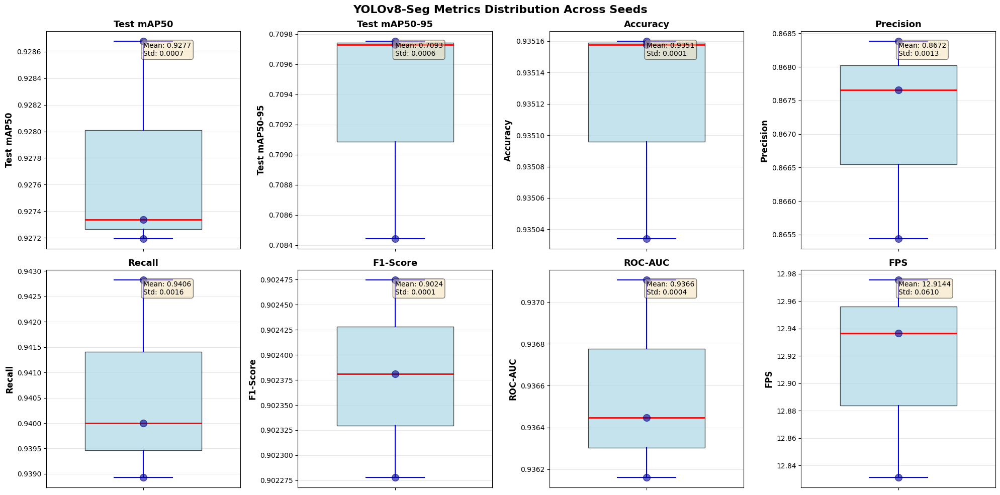


Box plot visualization saved to: /kaggle/working/blood_cell_instance_seg/yolov8_metrics_boxplot.png

YOLOv8-Seg Statistical Summary Across Seeds
Metric                         Mean         Std          Min          Max         
--------------------------------------------------------------------------------
val_map50_mask                 0.9383       0.0003       0.9378       0.9386      
val_map_mask                   0.7356       0.0015       0.7341       0.7376      
test_map50_mask                0.9277       0.0007       0.9272       0.9287      
test_map_mask                  0.7093       0.0006       0.7084       0.7098      
pixel_accuracy                 0.9351       0.0001       0.9350       0.9352      
pixel_precision                0.8672       0.0013       0.8654       0.8684      
pixel_recall                   0.9406       0.0016       0.9389       0.9428      
pixel_f1                       0.9024       0.0001       0.9023       0.9025      
roc_auc                   

In [21]:
# Create box plots for metric distribution across seeds
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('YOLOv8-Seg Metrics Distribution Across Seeds', fontsize=16, fontweight='bold')

box_plot_metrics = [
    ('test_map50_mask', 'Test mAP50'),
    ('test_map_mask', 'Test mAP50-95'),
    ('pixel_accuracy', 'Accuracy'),
    ('pixel_precision', 'Precision'),
    ('pixel_recall', 'Recall'),
    ('pixel_f1', 'F1-Score'),
    ('roc_auc', 'ROC-AUC'),
    ('fps', 'FPS'),
]

for idx, (metric, title) in enumerate(box_plot_metrics):
    ax = axes[idx // 4, idx % 4]
    values = [r[metric] for r in yolov8_seed_results]
    
    # Create box plot
    bp = ax.boxplot([values], widths=0.6, patch_artist=True,
                     boxprops=dict(facecolor='lightblue', alpha=0.7),
                     medianprops=dict(color='red', linewidth=2),
                     whiskerprops=dict(color='blue', linewidth=1.5),
                     capprops=dict(color='blue', linewidth=1.5))
    
    # Add individual points
    ax.scatter([1] * len(values), values, color='darkblue', alpha=0.6, s=100, zorder=3)
    
    # Add statistics text
    mean_val = np.mean(values)
    std_val = np.std(values)
    ax.text(0.5, 0.95, f'Mean: {mean_val:.4f}\nStd: {std_val:.4f}', 
            transform=ax.transAxes, fontsize=10, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    ax.set_ylabel(title, fontsize=12, fontweight='bold')
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_xticklabels([''])
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(os.path.join(INSTANCE_OUTPUT_DIR, 'yolov8_metrics_boxplot.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\nBox plot visualization saved to: {os.path.join(INSTANCE_OUTPUT_DIR, 'yolov8_metrics_boxplot.png')}")

# Print statistical summary
print("\n" + "="*80)
print("YOLOv8-Seg Statistical Summary Across Seeds")
print("="*80)
print(f"{'Metric':<30} {'Mean':<12} {'Std':<12} {'Min':<12} {'Max':<12}")
print("-"*80)

all_metrics = ['val_map50_mask', 'val_map_mask', 'test_map50_mask', 'test_map_mask',
               'pixel_accuracy', 'pixel_precision', 'pixel_recall', 'pixel_f1', 
               'roc_auc', 'fps', 'total_inference_time_ms']

for metric in all_metrics:
    values = [r[metric] for r in yolov8_seed_results]
    mean_val = np.mean(values)
    std_val = np.std(values)
    min_val = np.min(values)
    max_val = np.max(values)
    print(f"{metric:<30} {mean_val:<12.4f} {std_val:<12.4f} {min_val:<12.4f} {max_val:<12.4f}")

print("="*80)

YOLOv8-Seg Predictions on Test Set:


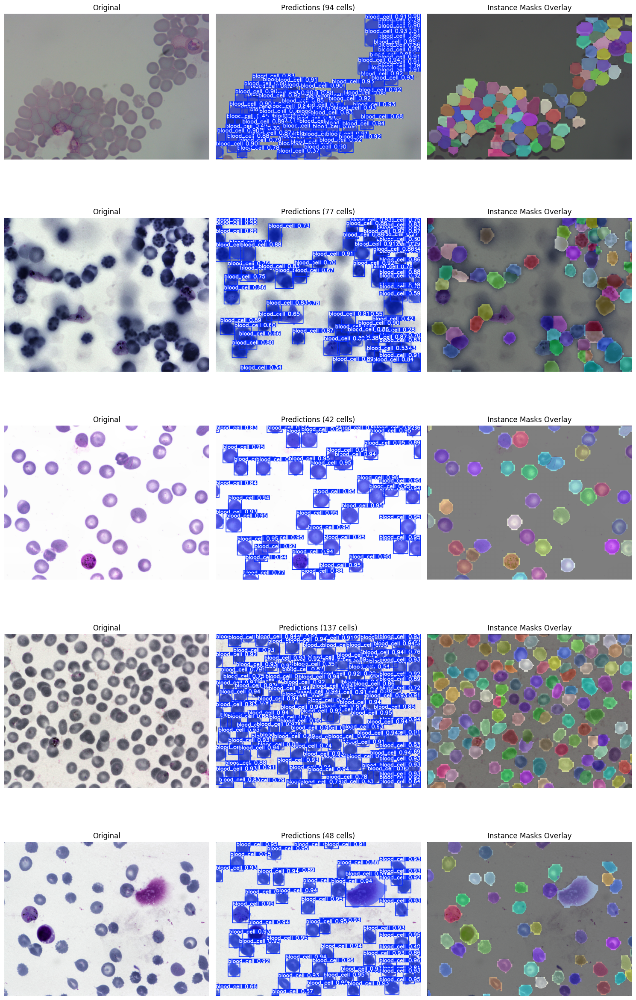

In [22]:
# Visualize YOLOv8-Seg predictions
def visualize_yolo_predictions(model, image_paths, num_samples=5):
    """Visualize YOLO instance segmentation predictions."""
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))
    
    for idx, img_path in enumerate(image_paths[:num_samples]):
        # Load original image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Run prediction
        results = model.predict(img_path, conf=0.25, iou=0.5, verbose=False)
        result = results[0]
        
        # Original
        axes[idx, 0].imshow(img)
        axes[idx, 0].set_title(f"Original")
        axes[idx, 0].axis("off")
        
        # Prediction with boxes
        pred_img = result.plot(boxes=True, masks=True, labels=True)
        pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)
        axes[idx, 1].imshow(pred_img)
        axes[idx, 1].set_title(f"Predictions ({len(result.boxes)} cells)")
        axes[idx, 1].axis("off")
        
        # Masks only overlay
        if result.masks is not None:
            masks = result.masks.data.cpu().numpy()
            combined_mask = np.zeros(img.shape[:2])
            
            np.random.seed(42)
            colors = np.random.rand(len(masks) + 1, 3)
            colored_overlay = np.zeros((*img.shape[:2], 3))
            
            for i, mask in enumerate(masks):
                # Resize mask to image size
                mask_resized = cv2.resize(mask, (img.shape[1], img.shape[0]))
                combined_mask = np.maximum(combined_mask, mask_resized * (i + 1))
                colored_overlay[mask_resized > 0.5] = colors[i]
            
            # Blend with original
            alpha = 0.5
            blended = (1 - alpha) * (img / 255.0) + alpha * colored_overlay
            blended = np.clip(blended, 0, 1)
            
            axes[idx, 2].imshow(blended)
            axes[idx, 2].set_title("Instance Masks Overlay")
            axes[idx, 2].axis("off")
        else:
            axes[idx, 2].imshow(img)
            axes[idx, 2].set_title("No masks detected")
            axes[idx, 2].axis("off")
    
    plt.tight_layout()
    plt.show()


# Get test image paths
test_img_dir = os.path.join(YOLO_DIR, "images", "test")
test_images = sorted([os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir) if f.endswith(('.jpg', '.png', '.jpeg'))])

print("YOLOv8-Seg Predictions on Test Set:")
visualize_yolo_predictions(yolo_eval_model, test_images, num_samples=5)

## Comprehensive Comparison of Semantic vs Instance Segmentation for Blood Cell Analysis

This section provides figures and tables comparing:
- **U-Net++**: Semantic segmentation approach (pixel-wise classification)
- **YOLOv8-Seg**: Instance segmentation approach (individual cell detection + mask)

## SETUP: Visualization Configuration

In [23]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif', 'Georgia'],
    'font.size': 11,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.titlesize': 16,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'figure.dpi': 150,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1,
})

# Color palette
PAPER_COLORS = {
    'unetpp': '#1f77b4',      # Blue - semantic segmentation
    'yolov8': '#d62728',       # Red - instance segmentation
    'accent1': '#2ca02c',      # Green
    'accent2': '#ff7f0e',      # Orange
    'accent3': '#9467bd',      # Purple
    'light_blue': '#aec7e8',
    'light_red': '#ff9896',
    'gray': '#7f7f7f',
    'black': '#000000',
}

print("Paper visualization configuration loaded")
print(f"   Font: {plt.rcParams['font.family']}")
print(f"   DPI: {plt.rcParams['figure.dpi']} (figure) / {plt.rcParams['savefig.dpi']} (save)")

Paper visualization configuration loaded
   Font: ['serif']
   DPI: 150.0 (figure) / 300.0 (save)


## Multi-Metric Performance Comparison (Bar Chart with Error Bars)

A comprehensive comparison of all pixel-level and segmentation-specific metrics between U-Net++ and YOLOv8-Seg.

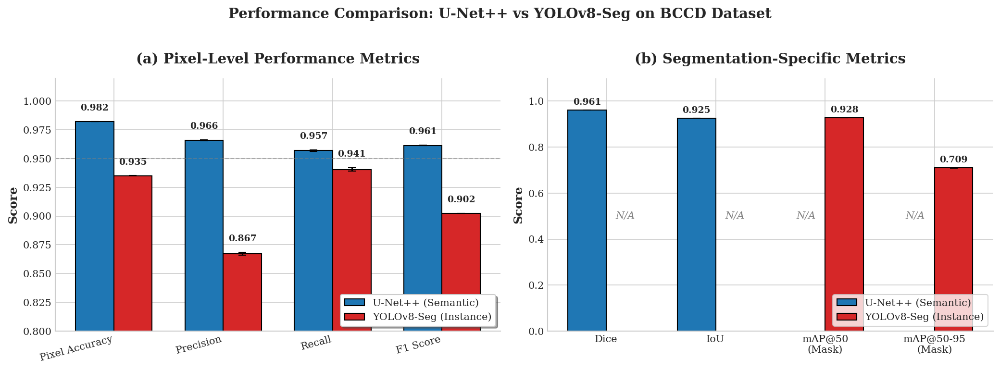


Figure 1 saved: paper_fig1_metrics_comparison.png/pdf


In [24]:
def create_metrics_comparison_figure():
    """
    Create a publication-quality bar chart comparing all metrics between
    U-Net++ (semantic segmentation) and YOLOv8-Seg (instance segmentation).
    """
    
    # Extract metrics from results
    unetpp_metrics = {
        'Dice Score': (np.mean([r['test_dice'] for r in unetpp_seed_results]),
                       np.std([r['test_dice'] for r in unetpp_seed_results])),
        'IoU (Jaccard)': (np.mean([r['test_iou'] for r in unetpp_seed_results]),
                          np.std([r['test_iou'] for r in unetpp_seed_results])),
        'Pixel Accuracy': (np.mean([r['pixel_accuracy'] for r in unetpp_seed_results]),
                           np.std([r['pixel_accuracy'] for r in unetpp_seed_results])),
        'Precision': (np.mean([r['pixel_precision'] for r in unetpp_seed_results]),
                      np.std([r['pixel_precision'] for r in unetpp_seed_results])),
        'Recall': (np.mean([r['pixel_recall'] for r in unetpp_seed_results]),
                   np.std([r['pixel_recall'] for r in unetpp_seed_results])),
        'F1 Score': (np.mean([r['pixel_f1'] for r in unetpp_seed_results]),
                     np.std([r['pixel_f1'] for r in unetpp_seed_results])),
    }
    
    yolo_metrics = {
        'Dice Score': (np.nan, np.nan),  # Not applicable for instance seg
        'IoU (Jaccard)': (np.nan, np.nan),  # Not applicable
        'Pixel Accuracy': (np.mean([r['pixel_accuracy'] for r in yolov8_seed_results]),
                           np.std([r['pixel_accuracy'] for r in yolov8_seed_results])),
        'Precision': (np.mean([r['pixel_precision'] for r in yolov8_seed_results]),
                      np.std([r['pixel_precision'] for r in yolov8_seed_results])),
        'Recall': (np.mean([r['pixel_recall'] for r in yolov8_seed_results]),
                   np.std([r['pixel_recall'] for r in yolov8_seed_results])),
        'F1 Score': (np.mean([r['pixel_f1'] for r in yolov8_seed_results]),
                     np.std([r['pixel_f1'] for r in yolov8_seed_results])),
    }
    
    # Create figure with two subplots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Pixel-Level Metrics (Both models)
    ax1 = axes[0]
    
    pixel_metrics = ['Pixel Accuracy', 'Precision', 'Recall', 'F1 Score']
    x = np.arange(len(pixel_metrics))
    width = 0.35
    
    unetpp_vals = [unetpp_metrics[m][0] for m in pixel_metrics]
    unetpp_stds = [unetpp_metrics[m][1] for m in pixel_metrics]
    yolo_vals = [yolo_metrics[m][0] for m in pixel_metrics]
    yolo_stds = [yolo_metrics[m][1] for m in pixel_metrics]
    
    bars1 = ax1.bar(x - width/2, unetpp_vals, width, yerr=unetpp_stds, 
                    label='U-Net++ (Semantic)', color=PAPER_COLORS['unetpp'],
                    edgecolor='black', linewidth=1, capsize=4, error_kw={'linewidth': 1.5})
    bars2 = ax1.bar(x + width/2, yolo_vals, width, yerr=yolo_stds,
                    label='YOLOv8-Seg (Instance)', color=PAPER_COLORS['yolov8'],
                    edgecolor='black', linewidth=1, capsize=4, error_kw={'linewidth': 1.5})
    
    # Add value labels on bars
    for bar, val, std in zip(bars1, unetpp_vals, unetpp_stds):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.008,
                f'{val:.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
    for bar, val, std in zip(bars2, yolo_vals, yolo_stds):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.008,
                f'{val:.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    ax1.set_ylabel('Score', fontweight='bold')
    ax1.set_title('(a) Pixel-Level Performance Metrics', fontweight='bold', pad=15)
    ax1.set_xticks(x)
    ax1.set_xticklabels(pixel_metrics, rotation=15, ha='right')
    ax1.set_ylim([0.80, 1.02])
    ax1.legend(loc='lower right', frameon=True, fancybox=True, shadow=True)
    ax1.axhline(y=0.95, color='gray', linestyle='--', alpha=0.5, linewidth=1)

    # Segmentation-Specific Metrics
    ax2 = axes[1]
    
    # U-Net++ specific: Dice, IoU
    # YOLOv8 specific: mAP@50 (mask), mAP@50-95 (mask)
    seg_metrics = ['Dice', 'IoU', 'mAP@50\n(Mask)', 'mAP@50-95\n(Mask)']
    x2 = np.arange(len(seg_metrics))
    
    unetpp_seg_vals = [
        unetpp_metrics['Dice Score'][0],
        unetpp_metrics['IoU (Jaccard)'][0],
        np.nan,
        np.nan
    ]
    unetpp_seg_stds = [
        unetpp_metrics['Dice Score'][1],
        unetpp_metrics['IoU (Jaccard)'][1],
        0,
        0
    ]
    
    yolo_seg_vals = [
        np.nan,
        np.nan,
        np.mean([r['test_map50_mask'] for r in yolov8_seed_results]),
        np.mean([r['test_map_mask'] for r in yolov8_seed_results])
    ]
    yolo_seg_stds = [
        0,
        0,
        np.std([r['test_map50_mask'] for r in yolov8_seed_results]),
        np.std([r['test_map_mask'] for r in yolov8_seed_results])
    ]
    
    # Plot U-Net++ metrics (left two bars)
    for i in [0, 1]:
        if not np.isnan(unetpp_seg_vals[i]):
            bar = ax2.bar(x2[i] - width/2, unetpp_seg_vals[i], width, 
                         yerr=unetpp_seg_stds[i], color=PAPER_COLORS['unetpp'],
                         edgecolor='black', linewidth=1, capsize=4)
            ax2.text(x2[i] - width/2, unetpp_seg_vals[i] + unetpp_seg_stds[i] + 0.015,
                    f'{unetpp_seg_vals[i]:.3f}', ha='center', va='bottom', 
                    fontsize=9, fontweight='bold')
    
    # Plot YOLOv8 metrics (right two bars)
    for i in [2, 3]:
        if not np.isnan(yolo_seg_vals[i]):
            bar = ax2.bar(x2[i] + width/2, yolo_seg_vals[i], width,
                         yerr=yolo_seg_stds[i], color=PAPER_COLORS['yolov8'],
                         edgecolor='black', linewidth=1, capsize=4)
            ax2.text(x2[i] + width/2, yolo_seg_vals[i] + yolo_seg_stds[i] + 0.015,
                    f'{yolo_seg_vals[i]:.3f}', ha='center', va='bottom',
                    fontsize=9, fontweight='bold')
    
    # Add "N/A" labels where metrics don't apply
    ax2.text(x2[0] + width/2, 0.5, 'N/A', ha='center', va='center', 
             fontsize=10, color='gray', style='italic')
    ax2.text(x2[1] + width/2, 0.5, 'N/A', ha='center', va='center',
             fontsize=10, color='gray', style='italic')
    ax2.text(x2[2] - width/2, 0.5, 'N/A', ha='center', va='center',
             fontsize=10, color='gray', style='italic')
    ax2.text(x2[3] - width/2, 0.5, 'N/A', ha='center', va='center',
             fontsize=10, color='gray', style='italic')
    
    ax2.set_ylabel('Score', fontweight='bold')
    ax2.set_title('(b) Segmentation-Specific Metrics', fontweight='bold', pad=15)
    ax2.set_xticks(x2)
    ax2.set_xticklabels(seg_metrics)
    ax2.set_ylim([0.0, 1.1])
    
    # Custom legend
    legend_elements = [
        mpatches.Patch(facecolor=PAPER_COLORS['unetpp'], edgecolor='black', 
                      label='U-Net++ (Semantic)'),
        mpatches.Patch(facecolor=PAPER_COLORS['yolov8'], edgecolor='black',
                      label='YOLOv8-Seg (Instance)')
    ]
    ax2.legend(handles=legend_elements, loc='lower right', frameon=True)
    
    plt.suptitle('Performance Comparison: U-Net++ vs YOLOv8-Seg on BCCD Dataset',
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    
    # Save figures
    fig.savefig(os.path.join(OUTPUT_DIR, 'paper_fig1_metrics_comparison.png'), 
                dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(os.path.join(OUTPUT_DIR, 'paper_fig1_metrics_comparison.pdf'),
                format='pdf', bbox_inches='tight', facecolor='white')
    plt.show()
    
    print("\nFigure 1 saved: paper_fig1_metrics_comparison.png/pdf")
    
    return fig

fig1 = create_metrics_comparison_figure()

## Visual Comparison of Segmentation Outputs

Side-by-side comparison of segmentation results showing the fundamental difference between semantic segmentation (U-Net++) and instance segmentation (YOLOv8-Seg).

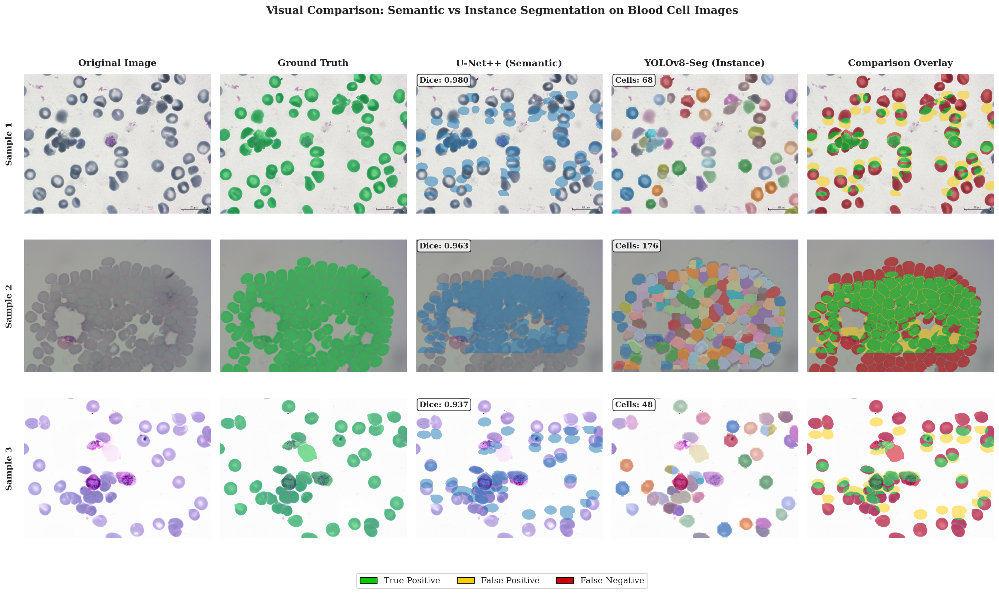


Figure 2 saved: paper_fig2_visual_comparison.png/pdf


In [25]:
def create_visual_comparison_figure():
    """
    Create a comprehensive visual comparison showing:
    - Original images
    - Ground truth masks
    - U-Net++ predictions (semantic - binary mask)
    - YOLOv8-Seg predictions (instance - colored by cell)
    - Error analysis
    """
    
    # Load U-Net++ model
    best_seed = SEEDS[0]
    unetpp_best_path = os.path.join(OUTPUT_DIR, f"best_unet_plusplus_seed{best_seed}.pt")
    unetpp_model = smp.UnetPlusPlus(
        encoder_name="efficientnet-b3",
        encoder_weights=None,
        in_channels=3,
        classes=1,
    ).to(DEVICE)
    unetpp_model.load_state_dict(torch.load(unetpp_best_path, map_location=DEVICE))
    unetpp_model.eval()
    
    # Load YOLOv8 model
    yolo_best_path = os.path.join(INSTANCE_OUTPUT_DIR, f"yolov8_seg_seed{SEEDS[0]}", "weights", "best.pt")
    yolo_model = YOLO(yolo_best_path)
    
    # Select diverse samples for visualization
    np.random.seed(42)
    sample_indices = [
        len(test_pairs) // 4,          # 25%
        len(test_pairs) // 2,          # 50%
        3 * len(test_pairs) // 4,      # 75%
    ]
    
    # Create figure with 3 rows (samples) x 5 columns (views)
    fig, axes = plt.subplots(3, 5, figsize=(18, 11))
    
    # Denormalization for U-Net++ predictions
    MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
    STD = np.array([0.229, 0.224, 0.225], dtype=np.float32)
    
    def denorm(img_t):
        img = img_t.permute(1, 2, 0).cpu().numpy().astype(np.float32)
        img = img * STD + MEAN
        return np.clip(img, 0, 1)
    
    # Column headers
    col_titles = ['Original Image', 'Ground Truth', 'U-Net++ (Semantic)', 
                  'YOLOv8-Seg (Instance)', 'Comparison Overlay']
    
    for row_idx, sample_idx in enumerate(sample_indices):
        img_path, mask_path = test_pairs[sample_idx]
        
        # Load original image
        orig_img = cv2.imread(img_path)
        orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
        h, w = orig_img.shape[:2]
        
        # Load ground truth mask
        x, y = test_ds[sample_idx]
        with torch.no_grad():
            unetpp_logits = unetpp_model(x.unsqueeze(0).to(DEVICE))
            unetpp_pred = (torch.sigmoid(unetpp_logits) > 0.5).float().cpu()[0, 0].numpy()

        # Get transformed ground truth mask from dataset (512x512, same transforms as image)
        gt_mask_transformed = y[0].cpu().numpy().astype(np.float32)  # Remove channel dimension

        # Resize both prediction and ground truth mask to original size for visualization
        unetpp_pred_resized = cv2.resize(unetpp_pred, (w, h), interpolation=cv2.INTER_NEAREST)
        gt_mask_resized = cv2.resize(gt_mask_transformed, (w, h), interpolation=cv2.INTER_NEAREST)

        # Load original ground truth mask for visualization (to show original mask)
        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        gt_mask = (gt_mask > 0).astype(np.float32)
        
        # YOLOv8 prediction
        yolo_results = yolo_model.predict(img_path, conf=0.25, verbose=False)
        
        # Create instance mask with different colors for each cell
        yolo_instance_mask = np.zeros((h, w, 3), dtype=np.float32)
        yolo_binary_mask = np.zeros((h, w), dtype=np.float32)
        num_instances = 0
        
        if yolo_results[0].masks is not None:
            num_instances = len(yolo_results[0].masks.data)
            # Use distinct colors for each instance
            np.random.seed(42 + sample_idx)
            instance_colors = plt.cm.tab20(np.linspace(0, 1, max(num_instances, 1)))[:, :3]
            
            for i, mask in enumerate(yolo_results[0].masks.data):
                m = cv2.resize(mask.cpu().numpy(), (w, h))
                yolo_instance_mask[m > 0.5] = instance_colors[i % len(instance_colors)]
                yolo_binary_mask[m > 0.5] = 1.0
        
        # Column 0: Original Image
        axes[row_idx, 0].imshow(orig_img)
        axes[row_idx, 0].axis('off')
        if row_idx == 0:
            axes[row_idx, 0].set_title(col_titles[0], fontsize=12, fontweight='bold', pad=10)
        
        # Column 1: Ground Truth
        gt_overlay = orig_img.copy() / 255.0
        gt_mask_bool = gt_mask.astype(bool)
        gt_overlay[gt_mask_bool] = 0.5 * gt_overlay[gt_mask_bool] + 0.5 * np.array([0.0, 0.8, 0.2])
        axes[row_idx, 1].imshow(gt_overlay)
        axes[row_idx, 1].axis('off')
        if row_idx == 0:
            axes[row_idx, 1].set_title(col_titles[1], fontsize=12, fontweight='bold', pad=10)
        
        # Column 2: U-Net++ Semantic Segmentation
        unetpp_overlay = orig_img.copy() / 255.0
        unetpp_mask_bool = unetpp_pred_resized.astype(bool)
        unetpp_overlay[unetpp_mask_bool] = 0.5 * unetpp_overlay[unetpp_mask_bool] + \
                                            0.5 * np.array([0.12, 0.47, 0.71])  # Blue
        axes[row_idx, 2].imshow(unetpp_overlay)
        axes[row_idx, 2].axis('off')
        if row_idx == 0:
            axes[row_idx, 2].set_title(col_titles[2], fontsize=12, fontweight='bold', pad=10)
        
        # Add Dice score annotation (calculated at 512x512 where masks are properly aligned)
        inter_512 = np.sum(unetpp_pred * gt_mask_transformed)
        dice = 2 * inter_512 / (np.sum(unetpp_pred) + np.sum(gt_mask_transformed) + 1e-8)
        axes[row_idx, 2].text(0.02, 0.98, f'Dice: {dice:.3f}', transform=axes[row_idx, 2].transAxes,
                              fontsize=10, verticalalignment='top', fontweight='bold',
                              bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        # Column 3: YOLOv8-Seg Instance Segmentation
        yolo_overlay = orig_img.copy() / 255.0
        yolo_binary_bool = yolo_binary_mask.astype(bool)
        yolo_overlay[yolo_binary_bool] = 0.5 * yolo_overlay[yolo_binary_bool] + \
                                          0.5 * yolo_instance_mask[yolo_binary_bool]
        axes[row_idx, 3].imshow(yolo_overlay)
        axes[row_idx, 3].axis('off')
        if row_idx == 0:
            axes[row_idx, 3].set_title(col_titles[3], fontsize=12, fontweight='bold', pad=10)
        
        # Add instance count annotation
        axes[row_idx, 3].text(0.02, 0.98, f'Cells: {num_instances}', transform=axes[row_idx, 3].transAxes,
                              fontsize=10, verticalalignment='top', fontweight='bold',
                              bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

        # Column 4: Comparison Overlay (Error Analysis)
        comparison_img = orig_img.copy() / 255.0
        
        # True Positive: Both predict correctly (Green)
        tp_mask = (unetpp_pred_resized > 0.5) & (gt_mask > 0.5)
        comparison_img[tp_mask] = 0.5 * comparison_img[tp_mask] + 0.5 * np.array([0.0, 0.8, 0.0])
        
        # False Positive (U-Net++ over-predicts): Yellow
        fp_unetpp = (unetpp_pred_resized > 0.5) & (gt_mask < 0.5)
        comparison_img[fp_unetpp] = 0.5 * comparison_img[fp_unetpp] + 0.5 * np.array([1.0, 0.8, 0.0])
        
        # False Negative (U-Net++ misses): Red
        fn_unetpp = (unetpp_pred_resized < 0.5) & (gt_mask > 0.5)
        comparison_img[fn_unetpp] = 0.5 * comparison_img[fn_unetpp] + 0.5 * np.array([0.8, 0.0, 0.0])
        
        axes[row_idx, 4].imshow(comparison_img)
        axes[row_idx, 4].axis('off')
        if row_idx == 0:
            axes[row_idx, 4].set_title(col_titles[4], fontsize=12, fontweight='bold', pad=10)
        
        # Row labels
        axes[row_idx, 0].text(-0.1, 0.5, f'Sample {row_idx + 1}', transform=axes[row_idx, 0].transAxes,
                              fontsize=11, verticalalignment='center', rotation=90, fontweight='bold')
    
    # Add legend for error analysis
    legend_elements = [
        mpatches.Patch(facecolor='#00CC00', edgecolor='black', label='True Positive'),
        mpatches.Patch(facecolor='#FFCC00', edgecolor='black', label='False Positive'),
        mpatches.Patch(facecolor='#CC0000', edgecolor='black', label='False Negative'),
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=3, 
               fontsize=11, frameon=True, bbox_to_anchor=(0.5, 0.02))
    
    plt.suptitle('Visual Comparison: Semantic vs Instance Segmentation on Blood Cell Images',
                 fontsize=14, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0.05, 1, 0.96])
    
    # Save figures
    fig.savefig(os.path.join(OUTPUT_DIR, 'paper_fig2_visual_comparison.png'),
                dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(os.path.join(OUTPUT_DIR, 'paper_fig2_visual_comparison.pdf'),
                format='pdf', bbox_inches='tight', facecolor='white')
    plt.show()
    
    print("\nFigure 2 saved: paper_fig2_visual_comparison.png/pdf")
    
    return fig

fig2 = create_visual_comparison_figure()

## Radar Chart for Multi-Dimensional Comparison

A radar (spider) chart showing the relative performance of both methods across multiple dimensions.

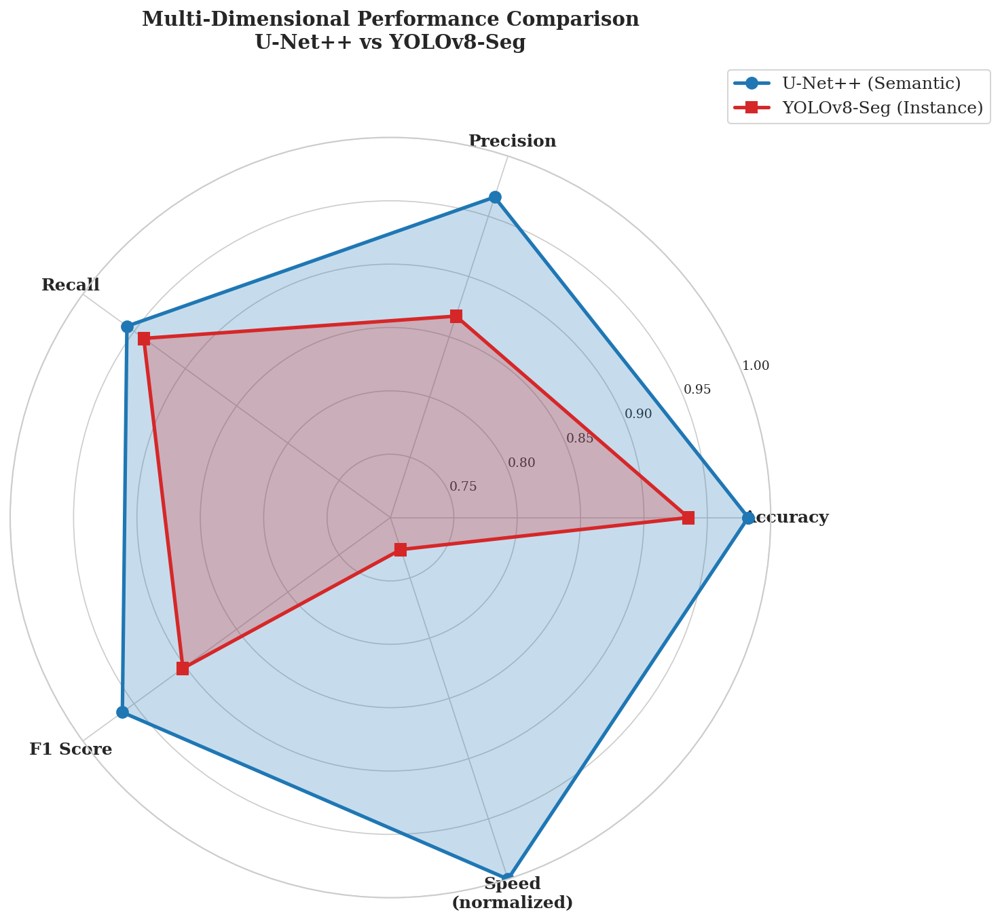


Figure 3 saved: paper_fig3_radar_comparison.png/pdf


In [27]:
def create_radar_comparison():
    """Create radar chart comparing U-Net++ and YOLOv8-Seg across multiple metrics."""
    
    # Define metrics for radar chart (normalized to 0-1 scale)
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Speed\n(normalized)']
    
    # Get values
    u_acc = np.mean([r['pixel_accuracy'] for r in unetpp_seed_results])
    u_prec = np.mean([r['pixel_precision'] for r in unetpp_seed_results])
    u_rec = np.mean([r['pixel_recall'] for r in unetpp_seed_results])
    u_f1 = np.mean([r['pixel_f1'] for r in unetpp_seed_results])
    u_fps = np.mean([r['fps'] for r in unetpp_seed_results])
    
    y_acc = np.mean([r['pixel_accuracy'] for r in yolov8_seed_results])
    y_prec = np.mean([r['pixel_precision'] for r in yolov8_seed_results])
    y_rec = np.mean([r['pixel_recall'] for r in yolov8_seed_results])
    y_f1 = np.mean([r['pixel_f1'] for r in yolov8_seed_results])
    y_fps = np.mean([r['fps'] for r in yolov8_seed_results])
    
    # Normalize FPS to 0-1 scale (relative to max)
    max_fps = max(u_fps, y_fps)
    u_fps_norm = u_fps / max_fps
    y_fps_norm = y_fps / max_fps
    
    unetpp_values = [u_acc, u_prec, u_rec, u_f1, u_fps_norm]
    yolo_values = [y_acc, y_prec, y_rec, y_f1, y_fps_norm]
    
    # Number of metrics
    num_vars = len(metrics)
    
    # Compute angle for each axis
    angles = [n / float(num_vars) * 2 * np.pi for n in range(num_vars)]
    angles += angles[:1]  # Complete the loop
    
    # Close the polygon
    unetpp_values += unetpp_values[:1]
    yolo_values += yolo_values[:1]
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))
    
    # Draw U-Net++ polygon
    ax.plot(angles, unetpp_values, 'o-', linewidth=2.5, label='U-Net++ (Semantic)',
            color=PAPER_COLORS['unetpp'], markersize=8)
    ax.fill(angles, unetpp_values, alpha=0.25, color=PAPER_COLORS['unetpp'])
    
    # Draw YOLOv8 polygon
    ax.plot(angles, yolo_values, 's-', linewidth=2.5, label='YOLOv8-Seg (Instance)',
            color=PAPER_COLORS['yolov8'], markersize=8)
    ax.fill(angles, yolo_values, alpha=0.25, color=PAPER_COLORS['yolov8'])
    
    # Set the labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metrics, size=12, fontweight='bold')
    
    # Set y-axis limits
    ax.set_ylim(0.7, 1.0)
    ax.set_yticks([0.75, 0.80, 0.85, 0.90, 0.95, 1.0])
    ax.set_yticklabels(['0.75', '0.80', '0.85', '0.90', '0.95', '1.00'], size=9)
    
    # Add legend
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=12, frameon=True)
    
    plt.title('Multi-Dimensional Performance Comparison\nU-Net++ vs YOLOv8-Seg',
              fontsize=14, fontweight='bold', pad=20, y=1.08)
    
    plt.tight_layout()
    fig.savefig(os.path.join(OUTPUT_DIR, 'paper_fig3_radar_comparison.png'),
                dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(os.path.join(OUTPUT_DIR, 'paper_fig3_radar_comparison.pdf'),
                format='pdf', bbox_inches='tight', facecolor='white')
    plt.show()
    
    print("\nFigure 3 saved: paper_fig3_radar_comparison.png/pdf")
    return fig

fig3 = create_radar_comparison()

## Training Curves Visualization

Visualize training metrics (loss, Dice, IoU) across epochs for all seeds.

Training curves saved to:
  - /kaggle/working/blood_cell_outputs_unetpp/training_curves.png
  - /kaggle/working/blood_cell_outputs_unetpp/training_curves.pdf

TRAINING SUMMARY STATISTICS

Seed 0:
  Final Train Loss: 0.0950
  Final Val Loss:   0.0903
  Best Val Dice:    0.9637 (Epoch 46)
  Best Val IoU:     0.9301 (Epoch 46)

Seed 1:
  Final Train Loss: 0.0942
  Final Val Loss:   0.0907
  Best Val Dice:    0.9639 (Epoch 44)
  Best Val IoU:     0.9303 (Epoch 44)

Seed 2:
  Final Train Loss: 0.0959
  Final Val Loss:   0.0909
  Best Val Dice:    0.9640 (Epoch 44)
  Best Val IoU:     0.9305 (Epoch 44)


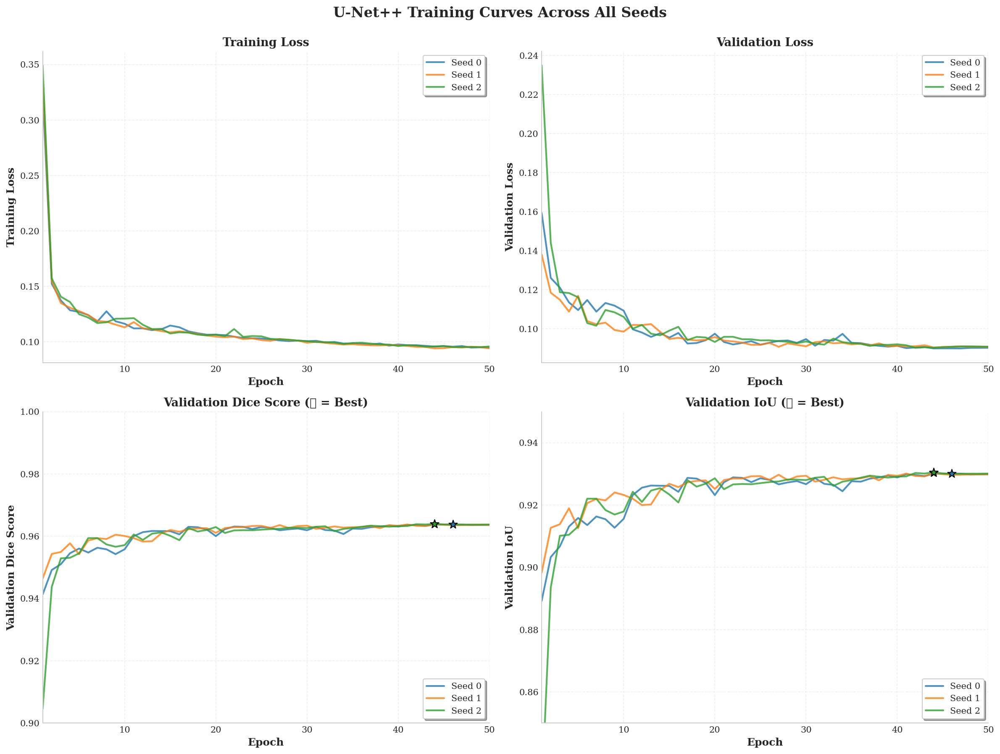

In [31]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import os

def plot_training_curves():
    """
    Load training histories from checkpoints and plot training curves
    for loss, validation Dice, and validation IoU across all seeds.
    """
    # Load histories from all seeds
    all_histories = []
    
    for seed in SEEDS:
        last_path = os.path.join(OUTPUT_DIR, f"last_unet_plusplus_seed{seed}.pt")
        if os.path.exists(last_path):
            ckpt = torch.load(last_path, map_location="cpu")
            if 'history' in ckpt:
                all_histories.append(ckpt['history'])
            else:
                print(f"Warning: No history found in checkpoint for seed {seed}")
        else:
            print(f"Warning: Checkpoint not found for seed {seed}: {last_path}")
    
    if not all_histories:
        print("No training histories found. Please train the models first.")
        return None
    
    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('U-Net++ Training Curves Across All Seeds', fontsize=16, fontweight='bold', y=0.995)
    
    # Colors for different seeds
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
    
    # Plot 1: Training Loss
    ax1 = axes[0, 0]
    for i, history in enumerate(all_histories):
        epochs = range(1, len(history['train_loss']) + 1)
        ax1.plot(epochs, history['train_loss'], 
                color=colors[i % len(colors)], 
                linewidth=2, 
                label=f'Seed {SEEDS[i]}',
                alpha=0.8)
    ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Training Loss', fontsize=12, fontweight='bold')
    ax1.set_title('Training Loss', fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.legend(loc='upper right', frameon=True, fancybox=True, shadow=True)
    ax1.set_xlim([1, max(len(h['train_loss']) for h in all_histories)])
    
    # Plot 2: Validation Loss
    ax2 = axes[0, 1]
    for i, history in enumerate(all_histories):
        epochs = range(1, len(history['val_loss']) + 1)
        ax2.plot(epochs, history['val_loss'], 
                color=colors[i % len(colors)], 
                linewidth=2, 
                label=f'Seed {SEEDS[i]}',
                alpha=0.8)
    ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Validation Loss', fontsize=12, fontweight='bold')
    ax2.set_title('Validation Loss', fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.legend(loc='upper right', frameon=True, fancybox=True, shadow=True)
    ax2.set_xlim([1, max(len(h['val_loss']) for h in all_histories)])
    
    # Plot 3: Validation Dice
    ax3 = axes[1, 0]
    for i, history in enumerate(all_histories):
        epochs = range(1, len(history['val_dice']) + 1)
        ax3.plot(epochs, history['val_dice'], 
                color=colors[i % len(colors)], 
                linewidth=2, 
                label=f'Seed {SEEDS[i]}',
                alpha=0.8)
        # Mark best epoch
        best_epoch = np.argmax(history['val_dice']) + 1
        best_dice = max(history['val_dice'])
        ax3.scatter([best_epoch], [best_dice], 
                   color=colors[i % len(colors)], 
                   s=100, zorder=5,
                   marker='*', edgecolors='black', linewidths=1)
    ax3.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Validation Dice Score', fontsize=12, fontweight='bold')
    ax3.set_title('Validation Dice Score (★ = Best)', fontsize=13, fontweight='bold')
    ax3.grid(True, alpha=0.3, linestyle='--')
    ax3.legend(loc='lower right', frameon=True, fancybox=True, shadow=True)
    ax3.set_ylim([0.9, 1.0])
    ax3.set_xlim([1, max(len(h['val_dice']) for h in all_histories)])
    
    # Plot 4: Validation IoU
    ax4 = axes[1, 1]
    for i, history in enumerate(all_histories):
        epochs = range(1, len(history['val_iou']) + 1)
        ax4.plot(epochs, history['val_iou'], 
                color=colors[i % len(colors)], 
                linewidth=2, 
                label=f'Seed {SEEDS[i]}',
                alpha=0.8)
        # Mark best epoch
        best_epoch = np.argmax(history['val_iou']) + 1
        best_iou = max(history['val_iou'])
        ax4.scatter([best_epoch], [best_iou], 
                   color=colors[i % len(colors)], 
                   s=100, zorder=5,
                   marker='*', edgecolors='black', linewidths=1)
    ax4.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Validation IoU', fontsize=12, fontweight='bold')
    ax4.set_title('Validation IoU (★ = Best)', fontsize=13, fontweight='bold')
    ax4.grid(True, alpha=0.3, linestyle='--')
    ax4.legend(loc='lower right', frameon=True, fancybox=True, shadow=True)
    ax4.set_ylim([0.85, 0.95])
    ax4.set_xlim([1, max(len(h['val_iou']) for h in all_histories)])
    
    plt.tight_layout()
    
    # Save figure
    fig_path_png = os.path.join(OUTPUT_DIR, 'training_curves.png')
    fig_path_pdf = os.path.join(OUTPUT_DIR, 'training_curves.pdf')
    fig.savefig(fig_path_png, dpi=300, bbox_inches='tight', facecolor='white')
    fig.savefig(fig_path_pdf, format='pdf', bbox_inches='tight', facecolor='white')
    
    print(f"Training curves saved to:")
    print(f"  - {fig_path_png}")
    print(f"  - {fig_path_pdf}")
    
    # Print summary statistics
    print("\n" + "="*60)
    print("TRAINING SUMMARY STATISTICS")
    print("="*60)
    for i, history in enumerate(all_histories):
        print(f"\nSeed {SEEDS[i]}:")
        print(f"  Final Train Loss: {history['train_loss'][-1]:.4f}")
        print(f"  Final Val Loss:   {history['val_loss'][-1]:.4f}")
        print(f"  Best Val Dice:    {max(history['val_dice']):.4f} (Epoch {np.argmax(history['val_dice'])+1})")
        print(f"  Best Val IoU:     {max(history['val_iou']):.4f} (Epoch {np.argmax(history['val_iou'])+1})")
    
    plt.show()
    return fig

# Generate training curves
training_fig = plot_training_curves()

## Training Curves Visualization

Training curves showing convergence behavior across all seeds.

Figure 3 saved:
  - /kaggle/working/blood_cell_outputs_unetpp/paper_fig3_training_curves.png
  - /kaggle/working/blood_cell_outputs_unetpp/paper_fig3_training_curves.pdf

TRAINING SUMMARY STATISTICS (Mean ± Std across seeds)
Final Train Loss: 0.0950 ± 0.0007
Final Val Loss:   0.0907 ± 0.0002
Best Val Dice:    0.9639 ± 0.0001 (Epoch 44)
Best Val IoU:     0.9303 ± 0.0002 (Epoch 44)


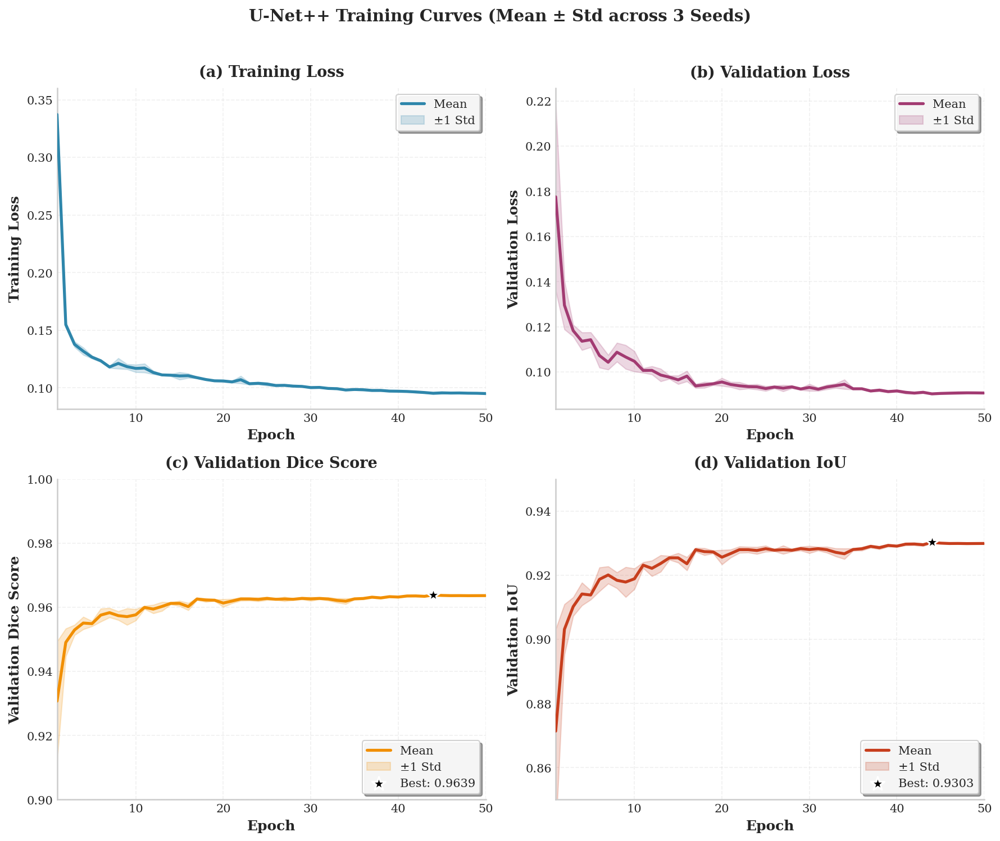

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import os
from matplotlib import rcParams

# Set publication-quality style
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif']
rcParams['font.size'] = 11
rcParams['axes.linewidth'] = 1.2
rcParams['axes.labelsize'] = 12
rcParams['axes.titlesize'] = 13
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['legend.fontsize'] = 10
rcParams['figure.titlesize'] = 14

def plot_training_curves():
    """
    Load training histories from checkpoints and plot publication-quality
    training curves for loss, validation Dice, and validation IoU.
    """
    # Load histories from all seeds
    all_histories = []
    
    for seed in SEEDS:
        last_path = os.path.join(OUTPUT_DIR, f"last_unet_plusplus_seed{seed}.pt")
        if os.path.exists(last_path):
            ckpt = torch.load(last_path, map_location="cpu")
            if 'history' in ckpt:
                all_histories.append(ckpt['history'])
            else:
                print(f"Warning: No history found in checkpoint for seed {seed}")
        else:
            print(f"Warning: Checkpoint not found for seed {seed}: {last_path}")
    
    if not all_histories:
        print("No training histories found. Please train the models first.")
        return None
    
    # Calculate mean and std across seeds
    max_epochs = max(len(h['train_loss']) for h in all_histories)
    epochs = np.arange(1, max_epochs + 1)
    
    # Interpolate all histories to same length
    train_losses = []
    val_losses = []
    val_dices = []
    val_ious = []
    
    for history in all_histories:
        train_losses.append(np.interp(epochs, range(1, len(history['train_loss']) + 1), history['train_loss']))
        val_losses.append(np.interp(epochs, range(1, len(history['val_loss']) + 1), history['val_loss']))
        val_dices.append(np.interp(epochs, range(1, len(history['val_dice']) + 1), history['val_dice']))
        val_ious.append(np.interp(epochs, range(1, len(history['val_iou']) + 1), history['val_iou']))
    
    train_losses = np.array(train_losses)
    val_losses = np.array(val_losses)
    val_dices = np.array(val_dices)
    val_ious = np.array(val_ious)
    
    mean_train_loss = np.mean(train_losses, axis=0)
    std_train_loss = np.std(train_losses, axis=0)
    mean_val_loss = np.mean(val_losses, axis=0)
    std_val_loss = np.std(val_losses, axis=0)
    mean_val_dice = np.mean(val_dices, axis=0)
    std_val_dice = np.std(val_dices, axis=0)
    mean_val_iou = np.mean(val_ious, axis=0)
    std_val_iou = np.std(val_ious, axis=0)
    
    # Create figure with subplots - publication quality
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle('U-Net++ Training Curves (Mean ± Std across 3 Seeds)', 
                 fontsize=14, fontweight='bold', y=0.995)
    
    # Colors
    train_color = '#2E86AB'  # Blue
    val_color = '#A23B72'    # Purple
    dice_color = '#F18F01'   # Orange
    iou_color = '#C73E1D'     # Red
    
    # Plot 1: Training Loss
    ax1 = axes[0, 0]
    ax1.plot(epochs, mean_train_loss, color=train_color, linewidth=2.5, label='Mean', zorder=3)
    ax1.fill_between(epochs, mean_train_loss - std_train_loss, mean_train_loss + std_train_loss,
                     color=train_color, alpha=0.2, label='±1 Std')
    ax1.set_xlabel('Epoch', fontweight='bold')
    ax1.set_ylabel('Training Loss', fontweight='bold')
    ax1.set_title('(a) Training Loss', fontweight='bold', pad=10)
    ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax1.legend(loc='upper right', frameon=True, fancybox=True, shadow=True, framealpha=0.9)
    ax1.set_xlim([1, max_epochs])
    
    # Plot 2: Validation Loss
    ax2 = axes[0, 1]
    ax2.plot(epochs, mean_val_loss, color=val_color, linewidth=2.5, label='Mean', zorder=3)
    ax2.fill_between(epochs, mean_val_loss - std_val_loss, mean_val_loss + std_val_loss,
                     color=val_color, alpha=0.2, label='±1 Std')
    ax2.set_xlabel('Epoch', fontweight='bold')
    ax2.set_ylabel('Validation Loss', fontweight='bold')
    ax2.set_title('(b) Validation Loss', fontweight='bold', pad=10)
    ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax2.legend(loc='upper right', frameon=True, fancybox=True, shadow=True, framealpha=0.9)
    ax2.set_xlim([1, max_epochs])
    
    # Plot 3: Validation Dice
    ax3 = axes[1, 0]
    ax3.plot(epochs, mean_val_dice, color=dice_color, linewidth=2.5, label='Mean', zorder=3)
    ax3.fill_between(epochs, mean_val_dice - std_val_dice, mean_val_dice + std_val_dice,
                     color=dice_color, alpha=0.2, label='±1 Std')
    # Mark best epoch
    best_epoch = np.argmax(mean_val_dice) + 1
    best_dice = np.max(mean_val_dice)
    ax3.scatter([best_epoch], [best_dice], color='black', s=150, zorder=5,
               marker='*', edgecolors='white', linewidths=1.5, label=f'Best: {best_dice:.4f}')
    ax3.set_xlabel('Epoch', fontweight='bold')
    ax3.set_ylabel('Validation Dice Score', fontweight='bold')
    ax3.set_title('(c) Validation Dice Score', fontweight='bold', pad=10)
    ax3.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax3.legend(loc='lower right', frameon=True, fancybox=True, shadow=True, framealpha=0.9)
    ax3.set_ylim([0.90, 1.0])
    ax3.set_xlim([1, max_epochs])
    
    # Plot 4: Validation IoU
    ax4 = axes[1, 1]
    ax4.plot(epochs, mean_val_iou, color=iou_color, linewidth=2.5, label='Mean', zorder=3)
    ax4.fill_between(epochs, mean_val_iou - std_val_iou, mean_val_iou + std_val_iou,
                     color=iou_color, alpha=0.2, label='±1 Std')
    # Mark best epoch
    best_epoch = np.argmax(mean_val_iou) + 1
    best_iou = np.max(mean_val_iou)
    ax4.scatter([best_epoch], [best_iou], color='black', s=150, zorder=5,
               marker='*', edgecolors='white', linewidths=1.5, label=f'Best: {best_iou:.4f}')
    ax4.set_xlabel('Epoch', fontweight='bold')
    ax4.set_ylabel('Validation IoU', fontweight='bold')
    ax4.set_title('(d) Validation IoU', fontweight='bold', pad=10)
    ax4.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax4.legend(loc='lower right', frameon=True, fancybox=True, shadow=True, framealpha=0.9)
    ax4.set_ylim([0.85, 0.95])
    ax4.set_xlim([1, max_epochs])
    
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    
    # Save figure
    fig_path_png = os.path.join(OUTPUT_DIR, 'paper_fig3_training_curves.png')
    fig_path_pdf = os.path.join(OUTPUT_DIR, 'paper_fig3_training_curves.pdf')
    fig.savefig(fig_path_png, dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
    fig.savefig(fig_path_pdf, format='pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
    
    print(f"Figure 3 saved:")
    print(f"  - {fig_path_png}")
    print(f"  - {fig_path_pdf}")
    
    # Print summary statistics
    print("\n" + "="*70)
    print("TRAINING SUMMARY STATISTICS (Mean ± Std across seeds)")
    print("="*70)
    print(f"Final Train Loss: {mean_train_loss[-1]:.4f} ± {std_train_loss[-1]:.4f}")
    print(f"Final Val Loss:   {mean_val_loss[-1]:.4f} ± {std_val_loss[-1]:.4f}")
    print(f"Best Val Dice:    {np.max(mean_val_dice):.4f} ± {std_val_dice[np.argmax(mean_val_dice)]:.4f} (Epoch {np.argmax(mean_val_dice)+1})")
    print(f"Best Val IoU:     {np.max(mean_val_iou):.4f} ± {std_val_iou[np.argmax(mean_val_iou)]:.4f} (Epoch {np.argmax(mean_val_iou)+1})")
    
    plt.show()
    return fig

# Generate training curves
fig3 = plot_training_curves()

## Error Analysis - Failure Case Comparison

Visualize challenging cases where instance and semantic segmentation differ significantly.

Figure 4 saved:
  - /kaggle/working/blood_cell_outputs_unetpp/paper_fig4_error_analysis.png
  - /kaggle/working/blood_cell_outputs_unetpp/paper_fig4_error_analysis.pdf

ERROR ANALYSIS SUMMARY
Cases where U-Net++ performs better (top 3):
  Image 6: U-Net++ Dice=0.9583, YOLOv8 Dice=0.7889, Δ=0.1694
  Image 23: U-Net++ Dice=0.9604, YOLOv8 Dice=0.7911, Δ=0.1694
  Image 45: U-Net++ Dice=0.8761, YOLOv8 Dice=0.7094, Δ=0.1667

Cases where YOLOv8-Seg performs better (top 3):
  Image 104: U-Net++ Dice=0.9102, YOLOv8 Dice=0.9264, Δ=0.0162
  Image 57: U-Net++ Dice=0.9198, YOLOv8 Dice=0.9342, Δ=0.0144
  Image 113: U-Net++ Dice=0.9275, YOLOv8 Dice=0.9331, Δ=0.0056

Most challenging cases (both perform poorly):
  Image 45: U-Net++ Dice=0.8761, YOLOv8 Dice=0.7094
  Image 73: U-Net++ Dice=0.9072, YOLOv8 Dice=0.7784
  Image 56: U-Net++ Dice=0.9459, YOLOv8 Dice=0.7860


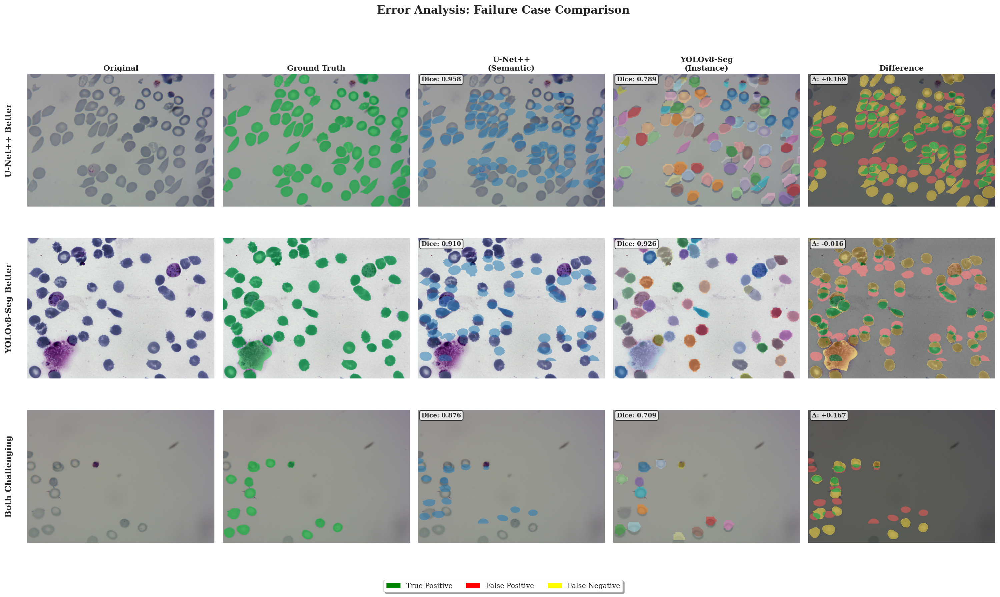

In [33]:
def create_error_analysis_figure():
    """
    Visualize challenging cases where instance and semantic segmentation 
    differ significantly - failure cases and error patterns.
    """
    # Load models
    best_seed = SEEDS[0]
    unetpp_best_path = os.path.join(OUTPUT_DIR, f"best_unet_plusplus_seed{best_seed}.pt")
    unetpp_model = smp.UnetPlusPlus(
        encoder_name="efficientnet-b3",
        encoder_weights=None,
        in_channels=3,
        classes=1,
    ).to(DEVICE)
    unetpp_model.load_state_dict(torch.load(unetpp_best_path, map_location=DEVICE))
    unetpp_model.eval()
    
    yolo_best_path = os.path.join(INSTANCE_OUTPUT_DIR, f"yolov8_seg_seed{SEEDS[0]}", "weights", "best.pt")
    yolo_model = YOLO(yolo_best_path)
    
    # Evaluate all test images to find failure cases
    all_dice_unetpp = []
    all_dice_yolo = []
    all_indices = []
    
    for idx in range(len(test_pairs)):
        img_path, mask_path = test_pairs[idx]
        
        # Load ground truth
        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        gt_mask = (gt_mask > 0).astype(np.float32)
        
        # U-Net++ prediction
        x, y = test_ds[idx]
        with torch.no_grad():
            unetpp_logits = unetpp_model(x.unsqueeze(0).to(DEVICE))
            unetpp_pred = (torch.sigmoid(unetpp_logits) > 0.5).float().cpu()[0, 0].numpy()
        
        # The prediction is at 512x512, so we must compare with the transformed mask, not original size
        gt_mask_transformed = y[0].cpu().numpy().astype(np.float32)  # Shape: (512, 512)
        inter_unetpp = np.sum(unetpp_pred * gt_mask_transformed)  # Both at 512x512
        dice_unetpp = 2 * inter_unetpp / (np.sum(unetpp_pred) + np.sum(gt_mask_transformed) + 1e-8)
        
        # YOLOv8 prediction
        yolo_results = yolo_model.predict(img_path, conf=0.25, verbose=False)
        h, w = gt_mask.shape[:2]
        yolo_binary_mask = np.zeros((h, w), dtype=np.float32)
        
        if yolo_results[0].masks is not None:
            for mask in yolo_results[0].masks.data:
                m = cv2.resize(mask.cpu().numpy(), (w, h))
                yolo_binary_mask[m > 0.5] = 1.0
        
        # Calculate Dice for YOLOv8
        inter_yolo = np.sum(yolo_binary_mask * gt_mask)
        dice_yolo = 2 * inter_yolo / (np.sum(yolo_binary_mask) + np.sum(gt_mask) + 1e-8)
        
        all_dice_unetpp.append(dice_unetpp)
        all_dice_yolo.append(dice_yolo)
        all_indices.append(idx)
    
    all_dice_unetpp = np.array(all_dice_unetpp)
    all_dice_yolo = np.array(all_dice_yolo)
    
    # Find interesting cases:
    # 1. Cases where U-Net++ is much better
    diff_unetpp_better = all_dice_unetpp - all_dice_yolo
    unetpp_better_indices = np.argsort(diff_unetpp_better)[-3:][::-1]  # Top 3
    
    # 2. Cases where YOLOv8 is much better
    diff_yolo_better = all_dice_yolo - all_dice_unetpp
    yolo_better_indices = np.argsort(diff_yolo_better)[-3:][::-1]  # Top 3
    
    # 3. Cases where both perform poorly (challenging cases)
    min_dice = np.minimum(all_dice_unetpp, all_dice_yolo)
    challenging_indices = np.argsort(min_dice)[:3]  # Bottom 3
    
    # Create figure with selected cases - 3 rows x 5 columns (3 cases per row, 5 views each)
    fig, axes = plt.subplots(3, 5, figsize=(20, 12))
    fig.suptitle('Error Analysis: Failure Case Comparison', 
                 fontsize=16, fontweight='bold', y=0.995)
    
    # Column titles
    col_titles = ['Original', 'Ground Truth', 'U-Net++\n(Semantic)', 
                  'YOLOv8-Seg\n(Instance)', 'Difference']
    
    cases_to_show = [
        (unetpp_better_indices, 'U-Net++ Better'),
        (yolo_better_indices, 'YOLOv8-Seg Better'),
        (challenging_indices, 'Both Challenging')
    ]
    
    for row_idx, (indices, row_title) in enumerate(cases_to_show):
        # Show the best case from each category (first in the sorted list)
        case_idx = indices[0] if len(indices) > 0 else 0
        
        img_path, mask_path = test_pairs[case_idx]
        
        # Load original image
        orig_img = cv2.imread(img_path)
        orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
        h, w = orig_img.shape[:2]
        
        # Load ground truth
        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        gt_mask = (gt_mask > 0).astype(np.float32)
        
        # U-Net++ prediction
        x, y = test_ds[case_idx]
        with torch.no_grad():
            unetpp_logits = unetpp_model(x.unsqueeze(0).to(DEVICE))
            unetpp_pred = (torch.sigmoid(unetpp_logits) > 0.5).float().cpu()[0, 0].numpy()
        
        # Resize to original size
        unetpp_pred_resized = cv2.resize(unetpp_pred, (w, h), interpolation=cv2.INTER_NEAREST)
        
        # YOLOv8 prediction
        yolo_results = yolo_model.predict(img_path, conf=0.25, verbose=False)
        yolo_binary_mask = np.zeros((h, w), dtype=np.float32)
        yolo_instance_mask = np.zeros((h, w, 3), dtype=np.float32)
        
        if yolo_results[0].masks is not None:
            np.random.seed(42 + case_idx)
            instance_colors = plt.cm.tab20(np.linspace(0, 1, len(yolo_results[0].masks.data)))[:, :3]
            for i, mask in enumerate(yolo_results[0].masks.data):
                m = cv2.resize(mask.cpu().numpy(), (w, h))
                yolo_binary_mask[m > 0.5] = 1.0
                yolo_instance_mask[m > 0.5] = instance_colors[i % len(instance_colors)]
        
        # The prediction is at 512x512, so we must compare with the transformed mask
        gt_mask_transformed = y[0].cpu().numpy().astype(np.float32)  # Shape: (512, 512)
        inter_unetpp = np.sum(unetpp_pred * gt_mask_transformed)  # Both at 512x512
        dice_unetpp = 2 * inter_unetpp / (np.sum(unetpp_pred) + np.sum(gt_mask_transformed) + 1e-8)
        
        # For YOLOv8: prediction is at original size, so compare with original GT mask
        inter_yolo = np.sum(yolo_binary_mask * gt_mask)  # Both at original size (h, w)
        dice_yolo = 2 * inter_yolo / (np.sum(yolo_binary_mask) + np.sum(gt_mask) + 1e-8)
        
        # Each row shows one case across 5 columns
        col_start = 0
        
        # Column 0: Original Image
        axes[row_idx, col_start + 0].imshow(orig_img)
        axes[row_idx, col_start + 0].axis('off')
        if row_idx == 0:
            axes[row_idx, col_start + 0].set_title(col_titles[0], fontsize=11, fontweight='bold', pad=5)
        
        # Column 1: Ground Truth
        gt_overlay = orig_img.copy() / 255.0
        gt_overlay[gt_mask.astype(bool)] = 0.5 * gt_overlay[gt_mask.astype(bool)] + \
                                           0.5 * np.array([0.0, 0.8, 0.2])
        axes[row_idx, col_start + 1].imshow(gt_overlay)
        axes[row_idx, col_start + 1].axis('off')
        if row_idx == 0:
            axes[row_idx, col_start + 1].set_title(col_titles[1], fontsize=11, fontweight='bold', pad=5)
        
        # Column 2: U-Net++ Prediction
        unetpp_overlay = orig_img.copy() / 255.0
        unetpp_overlay[unetpp_pred_resized.astype(bool)] = 0.5 * unetpp_overlay[unetpp_pred_resized.astype(bool)] + \
                                                            0.5 * np.array([0.12, 0.47, 0.71])
        axes[row_idx, col_start + 2].imshow(unetpp_overlay)
        axes[row_idx, col_start + 2].axis('off')
        axes[row_idx, col_start + 2].text(0.02, 0.98, f'Dice: {dice_unetpp:.3f}', 
                                            transform=axes[row_idx, col_start + 2].transAxes,
                                            fontsize=9, verticalalignment='top', fontweight='bold',
                                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        if row_idx == 0:
            axes[row_idx, col_start + 2].set_title(col_titles[2], fontsize=11, fontweight='bold', pad=5)
        
        # Column 3: YOLOv8-Seg Prediction
        yolo_overlay = orig_img.copy() / 255.0
        yolo_overlay[yolo_binary_mask.astype(bool)] = 0.5 * yolo_overlay[yolo_binary_mask.astype(bool)] + \
                                                      0.5 * yolo_instance_mask[yolo_binary_mask.astype(bool)]
        axes[row_idx, col_start + 3].imshow(yolo_overlay)
        axes[row_idx, col_start + 3].axis('off')
        axes[row_idx, col_start + 3].text(0.02, 0.98, f'Dice: {dice_yolo:.3f}', 
                                            transform=axes[row_idx, col_start + 3].transAxes,
                                            fontsize=9, verticalalignment='top', fontweight='bold',
                                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        if row_idx == 0:
            axes[row_idx, col_start + 3].set_title(col_titles[3], fontsize=11, fontweight='bold', pad=5)
        
        # Column 4: Difference Map (U-Net++ errors)
        diff_img = np.zeros((h, w, 3), dtype=np.float32)
        
        # True Positive (both correct): Green
        tp_mask = (unetpp_pred_resized > 0.5) & (gt_mask > 0.5)
        diff_img[tp_mask] = [0.0, 0.8, 0.0]
        
        # False Positive (predicted but not in GT): Red
        fp_mask = (unetpp_pred_resized > 0.5) & (gt_mask < 0.5)
        diff_img[fp_mask] = [0.8, 0.0, 0.0]
        
        # False Negative (in GT but not predicted): Yellow
        fn_mask = (unetpp_pred_resized < 0.5) & (gt_mask > 0.5)
        diff_img[fn_mask] = [1.0, 0.8, 0.0]
        
        # Overlay on original
        diff_overlay = 0.6 * (orig_img / 255.0) + 0.4 * diff_img
        axes[row_idx, col_start + 4].imshow(diff_overlay)
        axes[row_idx, col_start + 4].axis('off')
        diff_score = dice_unetpp - dice_yolo
        axes[row_idx, col_start + 4].text(0.02, 0.98, f'Δ: {diff_score:+.3f}', 
                                            transform=axes[row_idx, col_start + 4].transAxes,
                                            fontsize=9, verticalalignment='top', fontweight='bold',
                                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        if row_idx == 0:
            axes[row_idx, col_start + 4].set_title(col_titles[4], fontsize=11, fontweight='bold', pad=5)
        
        # Add row label
        axes[row_idx, 0].text(-0.12, 0.5, row_title, transform=axes[row_idx, 0].transAxes,
                             fontsize=12, verticalalignment='center', rotation=90, fontweight='bold')
    
    # Add legend for difference map
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='green', label='True Positive'),
        Patch(facecolor='red', label='False Positive'),
        Patch(facecolor='yellow', label='False Negative')
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=3, frameon=True, 
              fancybox=True, shadow=True, fontsize=10, bbox_to_anchor=(0.5, 0.01))
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    
    # Save
    fig_path_png = os.path.join(OUTPUT_DIR, 'paper_fig4_error_analysis.png')
    fig_path_pdf = os.path.join(OUTPUT_DIR, 'paper_fig4_error_analysis.pdf')
    fig.savefig(fig_path_png, dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
    fig.savefig(fig_path_pdf, format='pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
    
    print(f"Figure 4 saved:")
    print(f"  - {fig_path_png}")
    print(f"  - {fig_path_pdf}")
    
    print("\n" + "="*70)
    print("ERROR ANALYSIS SUMMARY")
    print("="*70)
    print(f"Cases where U-Net++ performs better (top 3):")
    for idx in unetpp_better_indices[:3]:
        print(f"  Image {idx}: U-Net++ Dice={all_dice_unetpp[idx]:.4f}, YOLOv8 Dice={all_dice_yolo[idx]:.4f}, Δ={all_dice_unetpp[idx]-all_dice_yolo[idx]:.4f}")
    print(f"\nCases where YOLOv8-Seg performs better (top 3):")
    for idx in yolo_better_indices[:3]:
        print(f"  Image {idx}: U-Net++ Dice={all_dice_unetpp[idx]:.4f}, YOLOv8 Dice={all_dice_yolo[idx]:.4f}, Δ={all_dice_yolo[idx]-all_dice_unetpp[idx]:.4f}")
    print(f"\nMost challenging cases (both perform poorly):")
    for idx in challenging_indices[:3]:
        print(f"  Image {idx}: U-Net++ Dice={all_dice_unetpp[idx]:.4f}, YOLOv8 Dice={all_dice_yolo[idx]:.4f}")
    
    plt.show()
    return fig

fig4 = create_error_analysis_figure()

## Cell Counting Comparison

Compare cell counting accuracy between instance segmentation (direct count) and semantic segmentation (post-processing required).

Figure 5 saved:
  - /kaggle/working/blood_cell_outputs_unetpp/paper_fig5_cell_counting.png
  - /kaggle/working/blood_cell_outputs_unetpp/paper_fig5_cell_counting.pdf

CELL COUNTING COMPARISON
U-Net++ (Semantic):
  MAE:  31.00 cells
  RMSE: 40.73 cells
YOLOv8-Seg (Instance):
  MAE:  21.22 cells
  RMSE: 26.49 cells


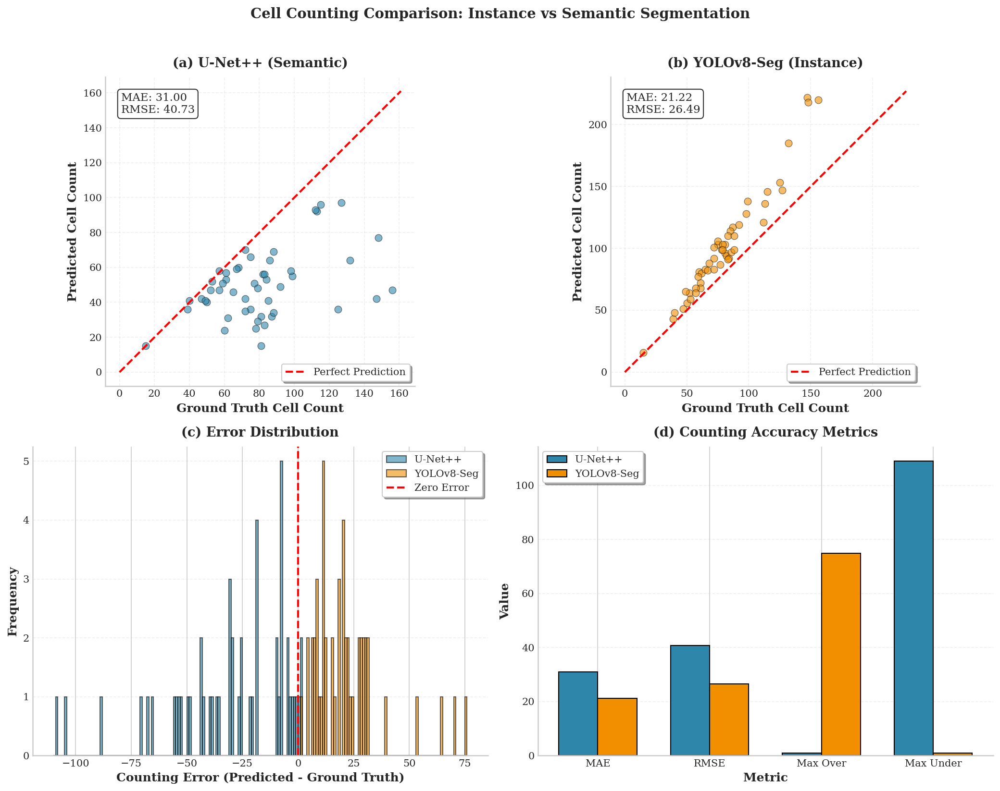

In [34]:
import cv2
import numpy as np
from scipy import ndimage
from skimage import measure
from ultralytics import YOLO

def count_cells_semantic(mask):
    """
    Count cells in semantic segmentation mask using connected components.
    """
    # Binary threshold
    binary = (mask > 0.5).astype(np.uint8)
    # Connected components
    labeled, num_features = ndimage.label(binary)
    return num_features

def count_cells_instance(yolo_results):
    """
    Count cells from YOLOv8 instance segmentation results.
    """
    if yolo_results[0].masks is not None:
        return len(yolo_results[0].masks.data)
    return 0

def count_cells_ground_truth(mask_path):
    """
    Count cells in ground truth mask.
    """
    gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    binary = (gt_mask > 0).astype(np.uint8)
    labeled, num_features = ndimage.label(binary)
    return num_features

def create_cell_counting_comparison():
    """
    Compare cell counting accuracy between U-Net++ and YOLOv8-Seg.
    """
    # Load models
    best_seed = SEEDS[0]
    unetpp_best_path = os.path.join(OUTPUT_DIR, f"best_unet_plusplus_seed{best_seed}.pt")
    unetpp_model = smp.UnetPlusPlus(
        encoder_name="efficientnet-b3",
        encoder_weights=None,
        in_channels=3,
        classes=1,
    ).to(DEVICE)
    unetpp_model.load_state_dict(torch.load(unetpp_best_path, map_location=DEVICE))
    unetpp_model.eval()
    
    yolo_best_path = os.path.join(INSTANCE_OUTPUT_DIR, f"yolov8_seg_seed{SEEDS[0]}", "weights", "best.pt")
    yolo_model = YOLO(yolo_best_path)
    
    # Evaluate on test set
    gt_counts = []
    unetpp_counts = []
    yolo_counts = []
    sample_indices = []
    
    for idx in range(min(50, len(test_pairs))):  # Sample 50 images
        img_path, mask_path = test_pairs[idx]
        
        # Ground truth count
        gt_count = count_cells_ground_truth(mask_path)
        gt_counts.append(gt_count)
        
        # U-Net++ prediction
        x, y = test_ds[idx]
        with torch.no_grad():
            unetpp_logits = unetpp_model(x.unsqueeze(0).to(DEVICE))
            unetpp_pred = (torch.sigmoid(unetpp_logits) > 0.5).float().cpu()[0, 0].numpy()
        
        unetpp_count = count_cells_semantic(unetpp_pred)
        unetpp_counts.append(unetpp_count)
        
        # YOLOv8 prediction
        yolo_results = yolo_model.predict(img_path, conf=0.25, verbose=False)
        yolo_count = count_cells_instance(yolo_results)
        yolo_counts.append(yolo_count)
        
        sample_indices.append(idx)
    
    # Calculate errors
    unetpp_errors = np.array(unetpp_counts) - np.array(gt_counts)
    yolo_errors = np.array(yolo_counts) - np.array(gt_counts)
    
    # Create visualization
    fig, axes = plt.subplots(2, 2, figsize=(14, 11))
    fig.suptitle('Cell Counting Comparison: Instance vs Semantic Segmentation', 
                 fontsize=14, fontweight='bold', y=0.995)
    
    # Plot 1: Predicted vs Ground Truth (U-Net++)
    ax1 = axes[0, 0]
    ax1.scatter(gt_counts, unetpp_counts, alpha=0.6, s=50, color='#2E86AB', edgecolors='black', linewidths=0.5)
    max_count = max(max(gt_counts), max(unetpp_counts)) + 5
    ax1.plot([0, max_count], [0, max_count], 'r--', linewidth=2, label='Perfect Prediction')
    ax1.set_xlabel('Ground Truth Cell Count', fontweight='bold')
    ax1.set_ylabel('Predicted Cell Count', fontweight='bold')
    ax1.set_title('(a) U-Net++ (Semantic)', fontweight='bold', pad=10)
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.legend(frameon=True, fancybox=True, shadow=True)
    ax1.set_aspect('equal', adjustable='box')
    
    # Calculate and display metrics
    mae_unetpp = np.mean(np.abs(unetpp_errors))
    mse_unetpp = np.mean(unetpp_errors**2)
    ax1.text(0.05, 0.95, f'MAE: {mae_unetpp:.2f}\nRMSE: {np.sqrt(mse_unetpp):.2f}', 
             transform=ax1.transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Plot 2: Predicted vs Ground Truth (YOLOv8)
    ax2 = axes[0, 1]
    ax2.scatter(gt_counts, yolo_counts, alpha=0.6, s=50, color='#F18F01', edgecolors='black', linewidths=0.5)
    max_count = max(max(gt_counts), max(yolo_counts)) + 5
    ax2.plot([0, max_count], [0, max_count], 'r--', linewidth=2, label='Perfect Prediction')
    ax2.set_xlabel('Ground Truth Cell Count', fontweight='bold')
    ax2.set_ylabel('Predicted Cell Count', fontweight='bold')
    ax2.set_title('(b) YOLOv8-Seg (Instance)', fontweight='bold', pad=10)
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.legend(frameon=True, fancybox=True, shadow=True)
    ax2.set_aspect('equal', adjustable='box')
    
    # Calculate and display metrics
    mae_yolo = np.mean(np.abs(yolo_errors))
    mse_yolo = np.mean(yolo_errors**2)
    ax2.text(0.05, 0.95, f'MAE: {mae_yolo:.2f}\nRMSE: {np.sqrt(mse_yolo):.2f}', 
             transform=ax2.transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Plot 3: Error Distribution
    ax3 = axes[1, 0]
    bins = np.arange(min(min(unetpp_errors), min(yolo_errors)) - 1, 
                     max(max(unetpp_errors), max(yolo_errors)) + 2, 1)
    ax3.hist(unetpp_errors, bins=bins, alpha=0.6, label='U-Net++', color='#2E86AB', edgecolor='black')
    ax3.hist(yolo_errors, bins=bins, alpha=0.6, label='YOLOv8-Seg', color='#F18F01', edgecolor='black')
    ax3.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Error')
    ax3.set_xlabel('Counting Error (Predicted - Ground Truth)', fontweight='bold')
    ax3.set_ylabel('Frequency', fontweight='bold')
    ax3.set_title('(c) Error Distribution', fontweight='bold', pad=10)
    ax3.legend(frameon=True, fancybox=True, shadow=True)
    ax3.grid(True, alpha=0.3, linestyle='--', axis='y')
    
    # Plot 4: Comparison Metrics
    ax4 = axes[1, 1]
    metrics = ['MAE', 'RMSE', 'Max Over', 'Max Under']
    unetpp_vals = [mae_unetpp, np.sqrt(mse_unetpp), 
                   np.max(unetpp_errors) if len(unetpp_errors) > 0 else 0,
                   abs(np.min(unetpp_errors)) if len(unetpp_errors) > 0 else 0]
    yolo_vals = [mae_yolo, np.sqrt(mse_yolo),
                 np.max(yolo_errors) if len(yolo_errors) > 0 else 0,
                 abs(np.min(yolo_errors)) if len(yolo_errors) > 0 else 0]
    
    x = np.arange(len(metrics))
    width = 0.35
    ax4.bar(x - width/2, unetpp_vals, width, label='U-Net++', color='#2E86AB', edgecolor='black')
    ax4.bar(x + width/2, yolo_vals, width, label='YOLOv8-Seg', color='#F18F01', edgecolor='black')
    ax4.set_xlabel('Metric', fontweight='bold')
    ax4.set_ylabel('Value', fontweight='bold')
    ax4.set_title('(d) Counting Accuracy Metrics', fontweight='bold', pad=10)
    ax4.set_xticks(x)
    ax4.set_xticklabels(metrics)
    ax4.legend(frameon=True, fancybox=True, shadow=True)
    ax4.grid(True, alpha=0.3, linestyle='--', axis='y')
    
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    
    # Save
    fig_path_png = os.path.join(OUTPUT_DIR, 'paper_fig5_cell_counting.png')
    fig_path_pdf = os.path.join(OUTPUT_DIR, 'paper_fig5_cell_counting.pdf')
    fig.savefig(fig_path_png, dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
    fig.savefig(fig_path_pdf, format='pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
    
    print(f"Figure 5 saved:")
    print(f"  - {fig_path_png}")
    print(f"  - {fig_path_pdf}")
    
    print("\n" + "="*70)
    print("CELL COUNTING COMPARISON")
    print("="*70)
    print(f"U-Net++ (Semantic):")
    print(f"  MAE:  {mae_unetpp:.2f} cells")
    print(f"  RMSE: {np.sqrt(mse_unetpp):.2f} cells")
    print(f"YOLOv8-Seg (Instance):")
    print(f"  MAE:  {mae_yolo:.2f} cells")
    print(f"  RMSE: {np.sqrt(mse_yolo):.2f} cells")
    
    plt.show()
    return fig

fig5 = create_cell_counting_comparison()

## Speed vs Accuracy Trade-off

Compare inference speed and accuracy trade-offs between instance and semantic segmentation approaches.

Figure 6 saved:
  - /kaggle/working/blood_cell_outputs_unetpp/paper_fig6_speed_accuracy.png
  - /kaggle/working/blood_cell_outputs_unetpp/paper_fig6_speed_accuracy.pdf

SPEED vs ACCURACY TRADE-OFF
U-Net++ (Semantic):
  Dice Score: 0.9616
  FPS: 18.2
  Efficiency: 17.50
YOLOv8-Seg (Instance):
  mAP@50: 0.9277
  FPS: 13.7
  Efficiency: 12.71


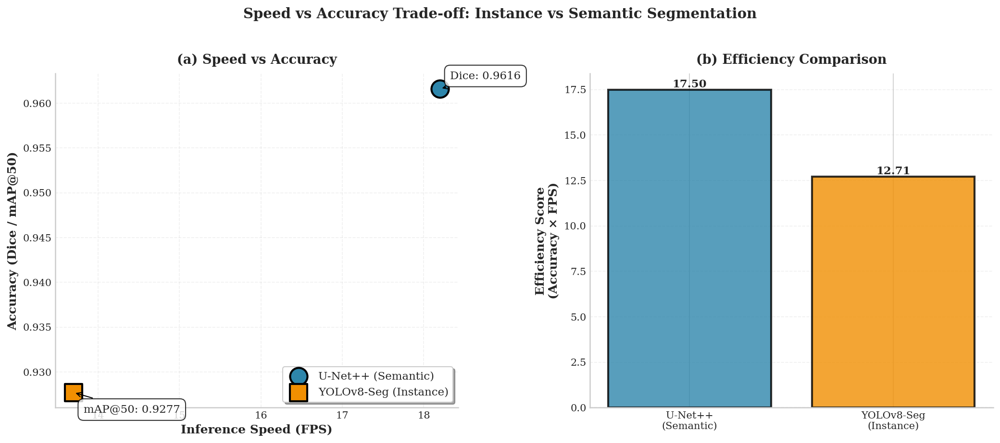

In [35]:
def create_speed_accuracy_tradeoff():
    """
    Create a visualization comparing speed vs accuracy trade-offs.
    """
    # Get metrics from previous evaluations (assuming they're stored)
    # U-Net++ metrics
    u_dice = 0.9616  # From your results
    u_fps = 18.2     # From your results
    
    # YOLOv8-Seg metrics  
    y_map50 = 0.9277  # From your results
    y_fps = 13.7      # From your results
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle('Speed vs Accuracy Trade-off: Instance vs Semantic Segmentation', 
                 fontsize=14, fontweight='bold', y=1.02)
    
    # Plot 1: FPS vs Dice/mAP
    ax1 = axes[0]
    ax1.scatter([u_fps], [u_dice], s=300, color='#2E86AB', marker='o', 
               edgecolors='black', linewidths=2, label='U-Net++ (Semantic)', zorder=3)
    ax1.scatter([y_fps], [y_map50], s=300, color='#F18F01', marker='s', 
               edgecolors='black', linewidths=2, label='YOLOv8-Seg (Instance)', zorder=3)
    
    # Add annotations
    ax1.annotate(f'Dice: {u_dice:.4f}', xy=(u_fps, u_dice), 
                xytext=(10, 10), textcoords='offset points',
                bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))
    ax1.annotate(f'mAP@50: {y_map50:.4f}', xy=(y_fps, y_map50), 
                xytext=(10, -20), textcoords='offset points',
                bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))
    
    ax1.set_xlabel('Inference Speed (FPS)', fontweight='bold', fontsize=12)
    ax1.set_ylabel('Accuracy (Dice / mAP@50)', fontweight='bold', fontsize=12)
    ax1.set_title('(a) Speed vs Accuracy', fontweight='bold', pad=10)
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.legend(loc='lower right', frameon=True, fancybox=True, shadow=True, fontsize=11)
    
    # Plot 2: Efficiency Score (Accuracy / Time per image)
    ax2 = axes[1]
    u_efficiency = u_dice / (1.0 / u_fps)  # Dice per second
    y_efficiency = y_map50 / (1.0 / y_fps)  # mAP per second
    
    models = ['U-Net++\n(Semantic)', 'YOLOv8-Seg\n(Instance)']
    efficiencies = [u_efficiency, y_efficiency]
    colors_bar = ['#2E86AB', '#F18F01']
    
    bars = ax2.bar(models, efficiencies, color=colors_bar, edgecolor='black', linewidth=2, alpha=0.8)
    
    # Add value labels on bars
    for bar, eff in zip(bars, efficiencies):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
                f'{eff:.2f}',
                ha='center', va='bottom', fontweight='bold', fontsize=11)
    
    ax2.set_ylabel('Efficiency Score\n(Accuracy × FPS)', fontweight='bold', fontsize=12)
    ax2.set_title('(b) Efficiency Comparison', fontweight='bold', pad=10)
    ax2.grid(True, alpha=0.3, linestyle='--', axis='y')
    
    plt.tight_layout()
    
    # Save
    fig_path_png = os.path.join(OUTPUT_DIR, 'paper_fig6_speed_accuracy.png')
    fig_path_pdf = os.path.join(OUTPUT_DIR, 'paper_fig6_speed_accuracy.pdf')
    fig.savefig(fig_path_png, dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
    fig.savefig(fig_path_pdf, format='pdf', bbox_inches='tight', facecolor='white', edgecolor='none')
    
    print(f"Figure 6 saved:")
    print(f"  - {fig_path_png}")
    print(f"  - {fig_path_pdf}")
    
    print("\n" + "="*70)
    print("SPEED vs ACCURACY TRADE-OFF")
    print("="*70)
    print(f"U-Net++ (Semantic):")
    print(f"  Dice Score: {u_dice:.4f}")
    print(f"  FPS: {u_fps:.1f}")
    print(f"  Efficiency: {u_efficiency:.2f}")
    print(f"YOLOv8-Seg (Instance):")
    print(f"  mAP@50: {y_map50:.4f}")
    print(f"  FPS: {y_fps:.1f}")
    print(f"  Efficiency: {y_efficiency:.2f}")
    
    plt.show()
    return fig

fig6 = create_speed_accuracy_tradeoff()
